In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [2]:
class Generator(nn.Module):
    def __init__(self, z_dim):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 384 * 4 * 4),
            nn.ReLU(True),

            nn.Unflatten(-1, (384, 4, 4)),
            nn.ConvTranspose2d(384, 192, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(192),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(192, 96, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(96),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(96, 3, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

In [3]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(16, 32, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(32, 64, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(64, 128, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(128, 256, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(256, 512, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),

            nn.Flatten(),
            nn.Linear(4*4*512, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)
    elif classname.find("Linear") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)

In [5]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  # Random Horizontal Flip Image
    transforms.RandomRotation(10),      # Randomly rotate the image ±10 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Adjust brightness, contrast, saturation and hue randomly
    transforms.RandomResizedCrop(32, scale=(0.8, 1.0)), # Random image cropping
    transforms.ToTensor(), # [0, 255] -> [0, 1]
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # [0, 1] -> [-1, 1]
])
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True, pin_memory=True, persistent_workers=True, prefetch_factor=4, num_workers=8)

Files already downloaded and verified


In [6]:
z_dim = 100
class_dim = 10
epochs = 1001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

generator = Generator(z_dim).to(device)
discriminator = Discriminator().to(device)

generator.apply(weights_init)
discriminator.apply(weights_init)

opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

adversarial_loss = nn.BCELoss()

In [7]:
def plot_losses(loss_disc_arr, loss_gen_arr, eps):
    plt.figure(figsize=(12,4))
    plt.plot(np.arange(0, eps+1), loss_disc_arr, label="disc")
    plt.plot(np.arange(0, eps+1), loss_gen_arr, label="gen")
    plt.xlabel("eps")
    plt.ylabel("loss")
    plt.title("Loss vs Epsilon (eps="+str(eps)+")")
    plt.legend()
    plt.show()

def plot_grads(grad_disc_arr, grad_gen_arr, eps):
    plt.figure(figsize=(12,4))
    plt.plot(np.arange(0, eps+1), grad_disc_arr, label="disc")
    plt.plot(np.arange(0, eps+1), grad_gen_arr, label="gen")
    plt.xlabel("eps")
    plt.ylabel("grad")
    plt.title("Grad vs Epsilon (eps="+str(eps)+")")
    plt.legend()
    plt.show()

Epoch [0/1001] Loss D: 1.50370, Loss G: 1.37993
Epoch [1/1001] Loss D: 1.50013, Loss G: 0.65615
Epoch [2/1001] Loss D: 1.89118, Loss G: 0.82455
Epoch [3/1001] Loss D: 0.87538, Loss G: 0.94559
Epoch [4/1001] Loss D: 1.24374, Loss G: 3.35717
Epoch [5/1001] Loss D: 1.44137, Loss G: 1.58183
Epoch [6/1001] Loss D: 0.89679, Loss G: 0.32475
Epoch [7/1001] Loss D: 1.14550, Loss G: 1.36753
Epoch [8/1001] Loss D: 0.97854, Loss G: 1.48836
Epoch [9/1001] Loss D: 1.76126, Loss G: 0.87590
Epoch [10/1001] Loss D: 1.85453, Loss G: 0.91836
Epoch [11/1001] Loss D: 1.50435, Loss G: 0.95083
Epoch [12/1001] Loss D: 1.55990, Loss G: 1.20948
Epoch [13/1001] Loss D: 1.34363, Loss G: 0.99637
Epoch [14/1001] Loss D: 1.80149, Loss G: 0.76337
Epoch [15/1001] Loss D: 1.05842, Loss G: 1.66793
Epoch [16/1001] Loss D: 1.04366, Loss G: 1.62056
Epoch [17/1001] Loss D: 1.99717, Loss G: 0.75953
Epoch [18/1001] Loss D: 1.21909, Loss G: 1.25529
Epoch [19/1001] Loss D: 1.49714, Loss G: 0.93229
Epoch [20/1001] Loss D: 1.5270

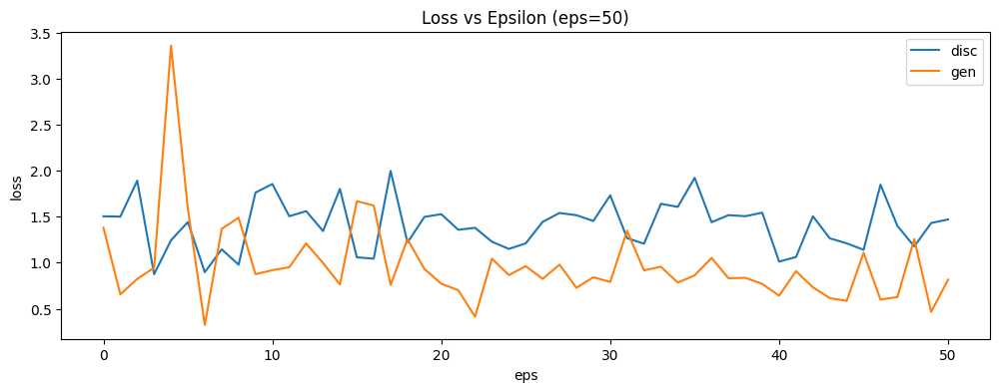

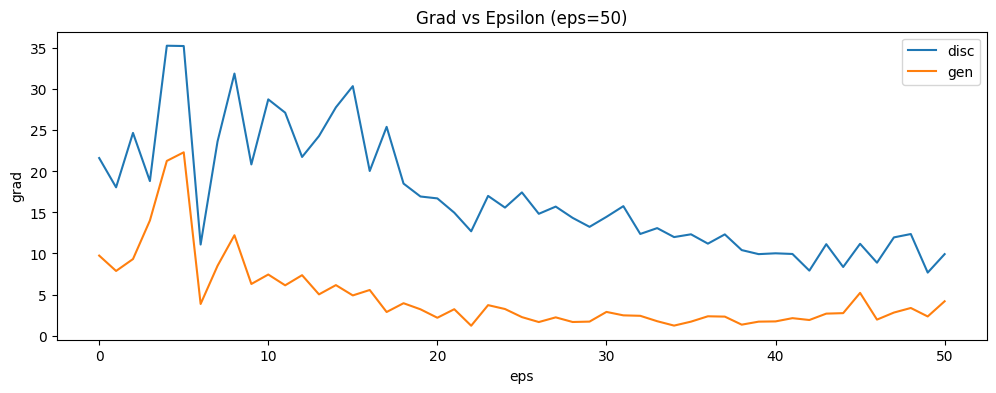

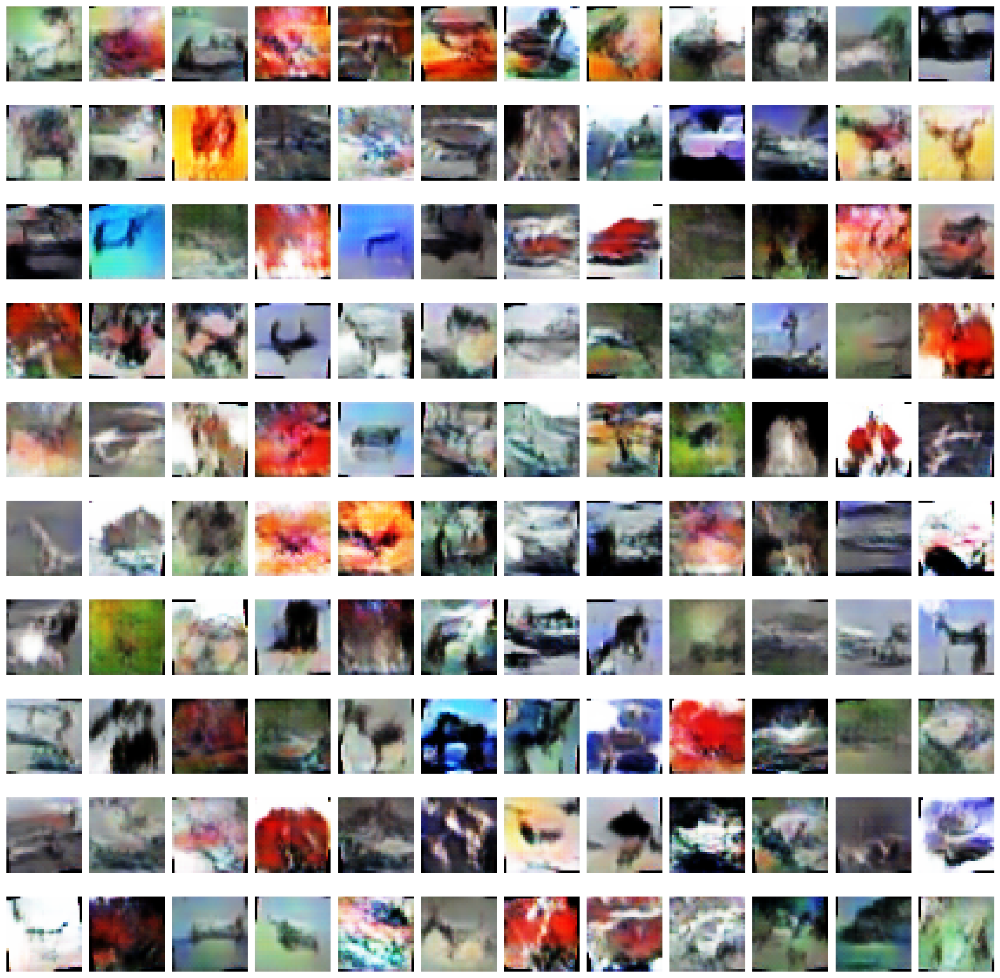

Epoch [51/1001] Loss D: 1.92884, Loss G: 0.55320
Epoch [52/1001] Loss D: 1.61600, Loss G: 0.74971
Epoch [53/1001] Loss D: 1.65620, Loss G: 1.55252
Epoch [54/1001] Loss D: 1.28995, Loss G: 1.64884
Epoch [55/1001] Loss D: 0.66352, Loss G: 1.33145
Epoch [56/1001] Loss D: 0.93892, Loss G: 0.58462
Epoch [57/1001] Loss D: 0.96084, Loss G: 1.59490
Epoch [58/1001] Loss D: 1.64537, Loss G: 1.37934
Epoch [59/1001] Loss D: 1.59556, Loss G: 0.65865
Epoch [60/1001] Loss D: 1.79418, Loss G: 1.17706
Epoch [61/1001] Loss D: 1.09207, Loss G: 0.63086
Epoch [62/1001] Loss D: 1.71891, Loss G: 0.78284
Epoch [63/1001] Loss D: 1.23491, Loss G: 0.52884
Epoch [64/1001] Loss D: 1.35538, Loss G: 0.95278
Epoch [65/1001] Loss D: 1.17965, Loss G: 0.63311
Epoch [66/1001] Loss D: 1.06090, Loss G: 1.46472
Epoch [67/1001] Loss D: 0.98728, Loss G: 0.80146
Epoch [68/1001] Loss D: 1.26078, Loss G: 1.34817
Epoch [69/1001] Loss D: 0.85976, Loss G: 0.45219
Epoch [70/1001] Loss D: 1.32079, Loss G: 0.67889
Epoch [71/1001] Loss

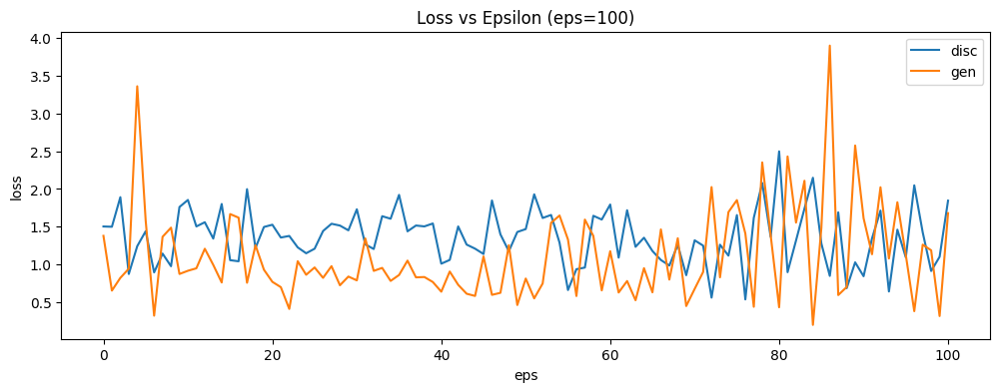

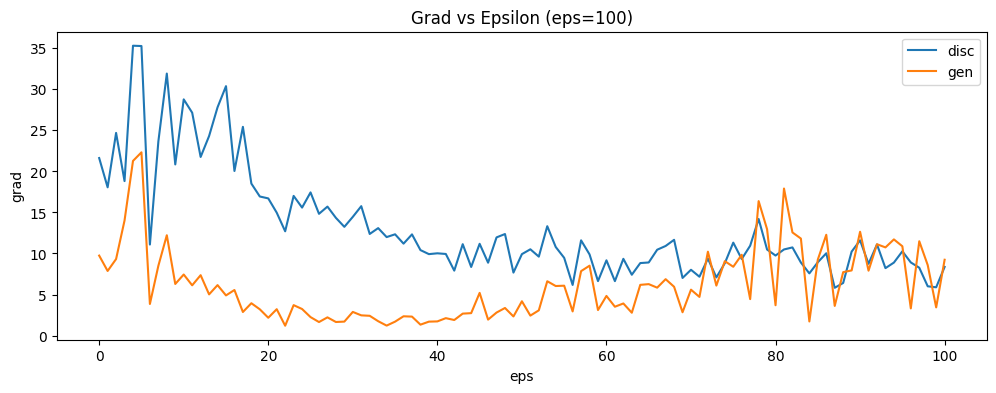

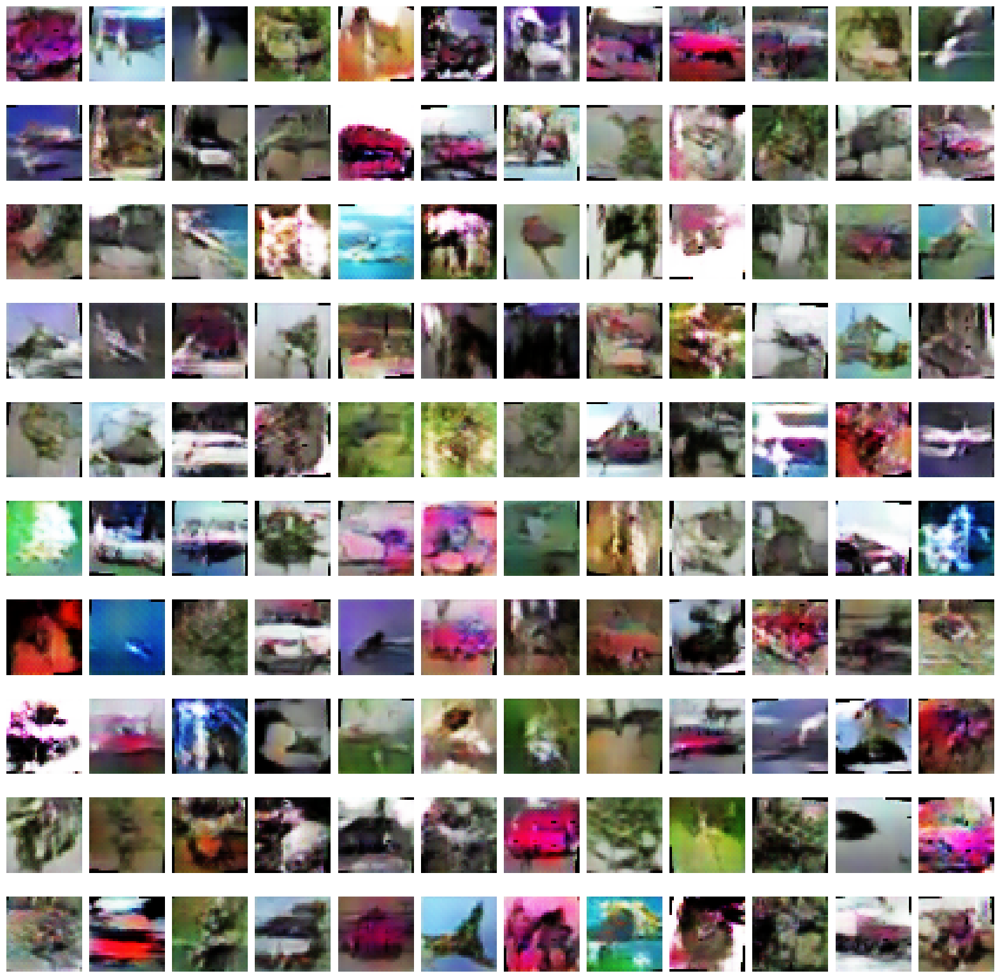

Epoch [101/1001] Loss D: 1.26124, Loss G: 0.64915
Epoch [102/1001] Loss D: 2.22697, Loss G: 2.07757
Epoch [103/1001] Loss D: 1.01429, Loss G: 1.44968
Epoch [104/1001] Loss D: 2.27039, Loss G: 0.46533
Epoch [105/1001] Loss D: 0.89802, Loss G: 1.65366
Epoch [106/1001] Loss D: 1.90502, Loss G: 0.93177
Epoch [107/1001] Loss D: 0.89705, Loss G: 2.18656
Epoch [108/1001] Loss D: 2.28837, Loss G: 0.90677
Epoch [109/1001] Loss D: 1.37465, Loss G: 1.51572
Epoch [110/1001] Loss D: 1.40693, Loss G: 1.23854
Epoch [111/1001] Loss D: 1.39407, Loss G: 1.49645
Epoch [112/1001] Loss D: 2.25549, Loss G: 0.99925
Epoch [113/1001] Loss D: 1.79994, Loss G: 0.54801
Epoch [114/1001] Loss D: 1.94425, Loss G: 0.72359
Epoch [115/1001] Loss D: 2.36348, Loss G: 2.15156
Epoch [116/1001] Loss D: 1.28526, Loss G: 1.90571
Epoch [117/1001] Loss D: 2.06763, Loss G: 0.59148
Epoch [118/1001] Loss D: 0.92513, Loss G: 0.54864
Epoch [119/1001] Loss D: 0.96133, Loss G: 1.35084
Epoch [120/1001] Loss D: 0.92378, Loss G: 0.70595


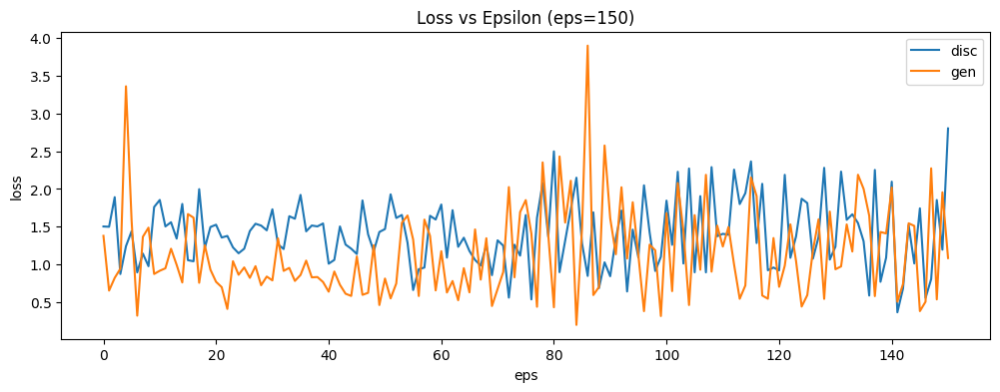

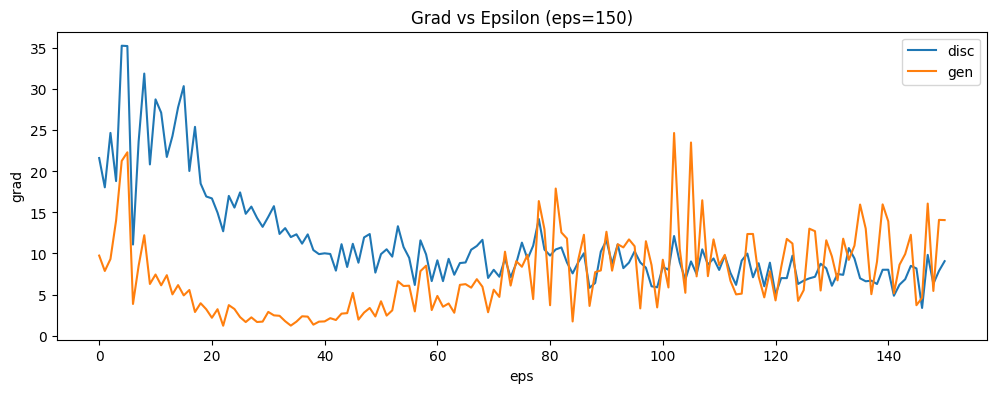

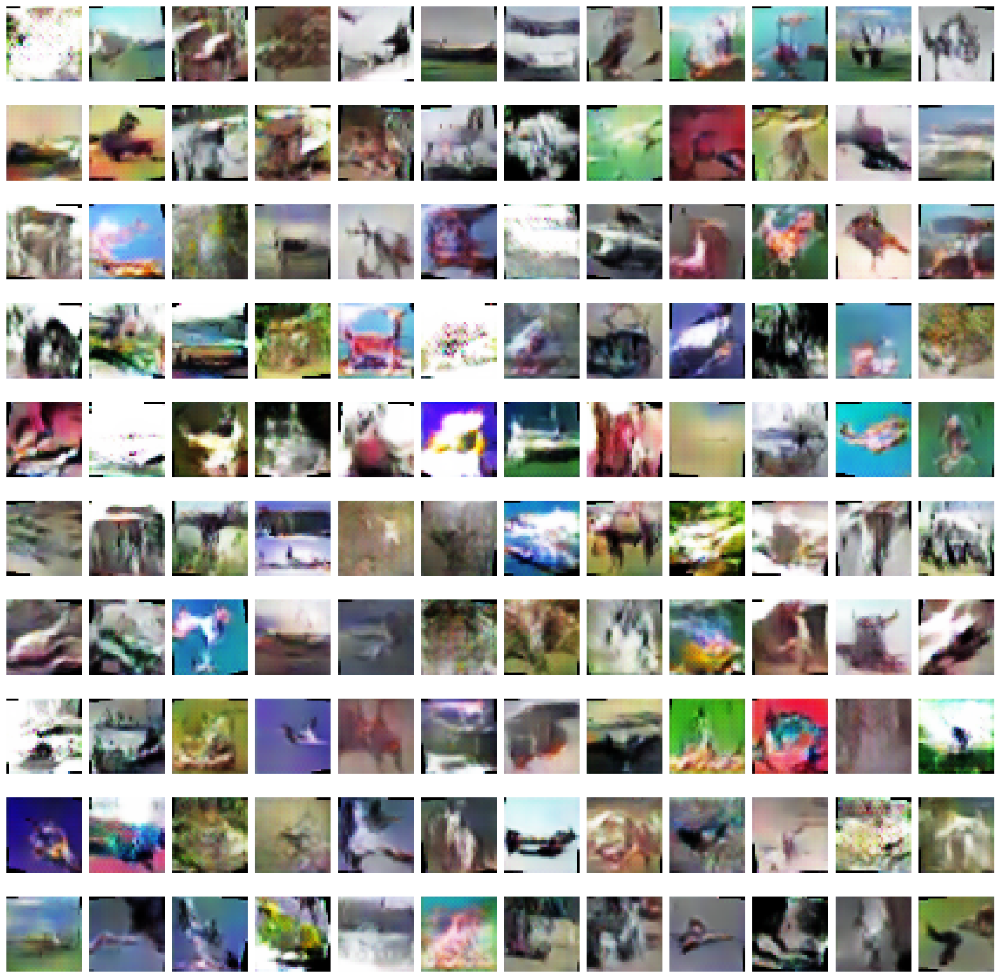

Epoch [151/1001] Loss D: 1.13499, Loss G: 1.16052
Epoch [152/1001] Loss D: 1.42097, Loss G: 0.57918
Epoch [153/1001] Loss D: 0.69114, Loss G: 1.84415
Epoch [154/1001] Loss D: 2.15628, Loss G: 0.60815
Epoch [155/1001] Loss D: 1.11877, Loss G: 1.86568
Epoch [156/1001] Loss D: 0.67228, Loss G: 1.03235
Epoch [157/1001] Loss D: 2.64945, Loss G: 0.42713
Epoch [158/1001] Loss D: 0.97188, Loss G: 1.30204
Epoch [159/1001] Loss D: 1.69378, Loss G: 0.87341
Epoch [160/1001] Loss D: 0.48755, Loss G: 0.12821
Epoch [161/1001] Loss D: 0.74861, Loss G: 1.29893
Epoch [162/1001] Loss D: 0.64595, Loss G: 0.93218
Epoch [163/1001] Loss D: 1.30716, Loss G: 0.39635
Epoch [164/1001] Loss D: 0.71412, Loss G: 2.37393
Epoch [165/1001] Loss D: 1.03060, Loss G: 1.39126
Epoch [166/1001] Loss D: 0.72417, Loss G: 0.60818
Epoch [167/1001] Loss D: 0.74174, Loss G: 0.41860
Epoch [168/1001] Loss D: 1.33803, Loss G: 0.57090
Epoch [169/1001] Loss D: 1.60234, Loss G: 1.56135
Epoch [170/1001] Loss D: 1.62904, Loss G: 1.77898


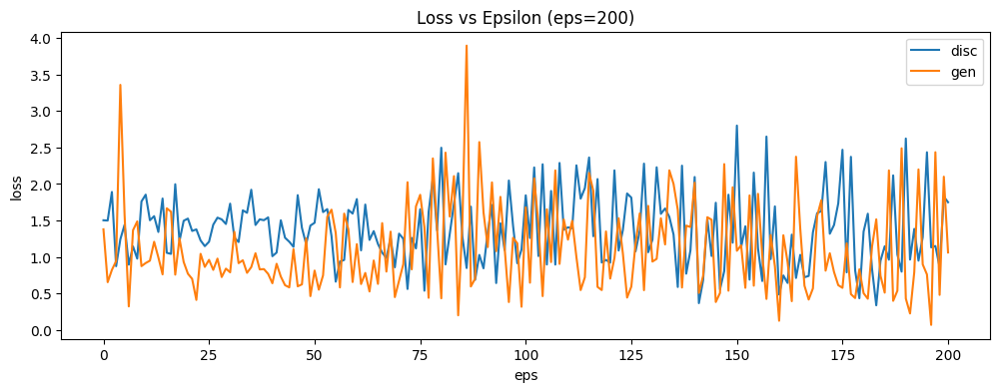

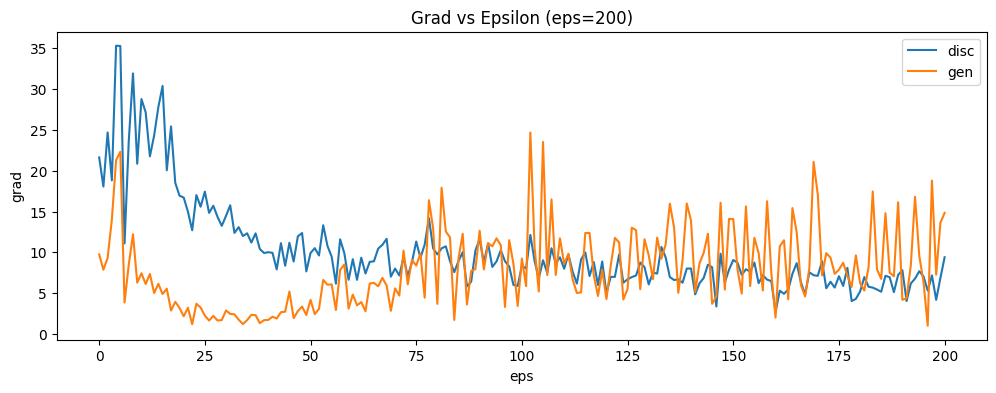

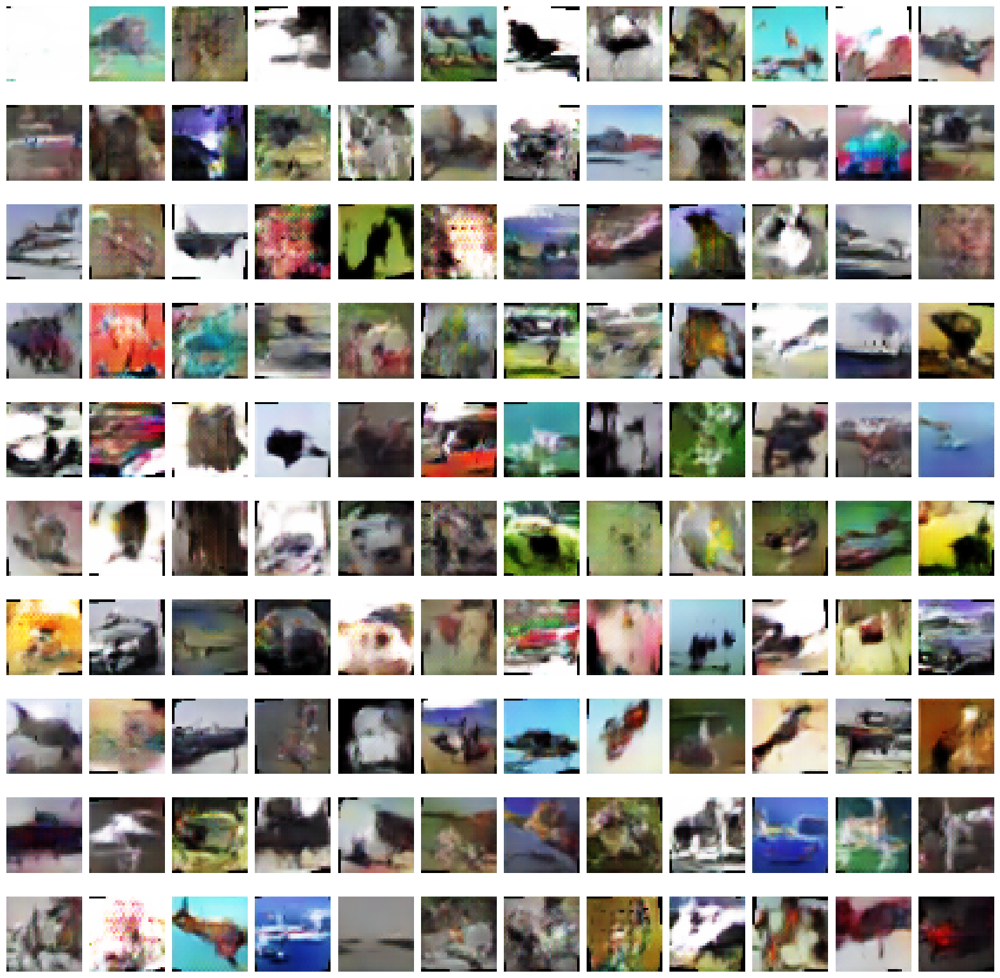

Epoch [201/1001] Loss D: 0.59497, Loss G: 2.01576
Epoch [202/1001] Loss D: 0.96983, Loss G: 2.17066
Epoch [203/1001] Loss D: 0.73527, Loss G: 0.41483
Epoch [204/1001] Loss D: 0.80206, Loss G: 0.97939
Epoch [205/1001] Loss D: 0.78458, Loss G: 0.43339
Epoch [206/1001] Loss D: 1.28848, Loss G: 0.75822
Epoch [207/1001] Loss D: 0.86545, Loss G: 0.27533
Epoch [208/1001] Loss D: 0.98187, Loss G: 1.33852
Epoch [209/1001] Loss D: 1.68675, Loss G: 2.26459
Epoch [210/1001] Loss D: 1.28664, Loss G: 0.93161
Epoch [211/1001] Loss D: 1.92376, Loss G: 1.28921
Epoch [212/1001] Loss D: 2.94000, Loss G: 0.43772
Epoch [213/1001] Loss D: 1.89997, Loss G: 0.47205
Epoch [214/1001] Loss D: 1.74184, Loss G: 1.03553
Epoch [215/1001] Loss D: 2.29591, Loss G: 0.67919
Epoch [216/1001] Loss D: 0.98262, Loss G: 3.26089
Epoch [217/1001] Loss D: 1.57079, Loss G: 3.92232
Epoch [218/1001] Loss D: 1.03659, Loss G: 1.39902
Epoch [219/1001] Loss D: 1.33233, Loss G: 0.71767
Epoch [220/1001] Loss D: 2.22211, Loss G: 0.77131


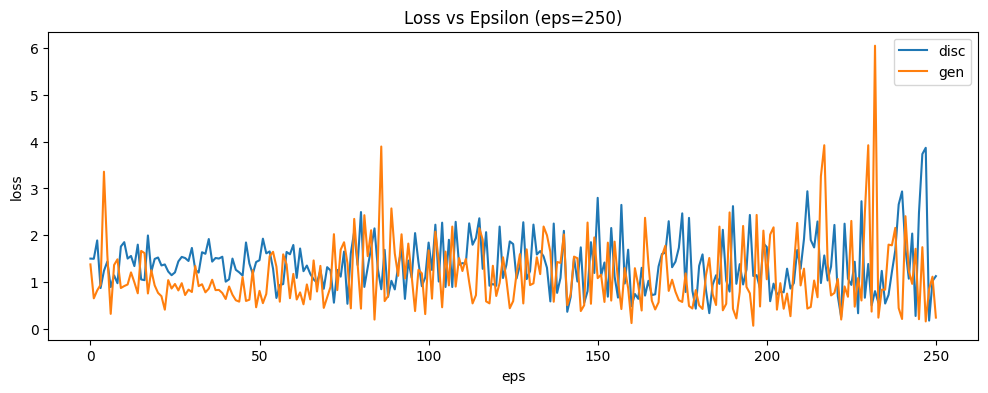

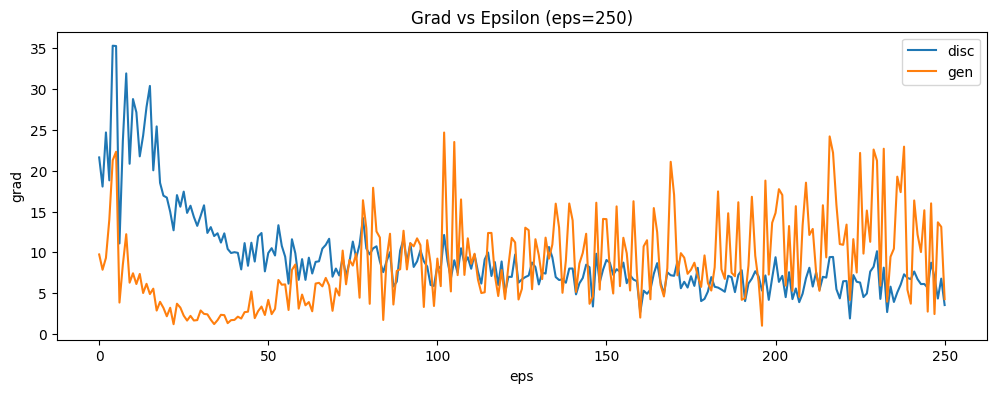

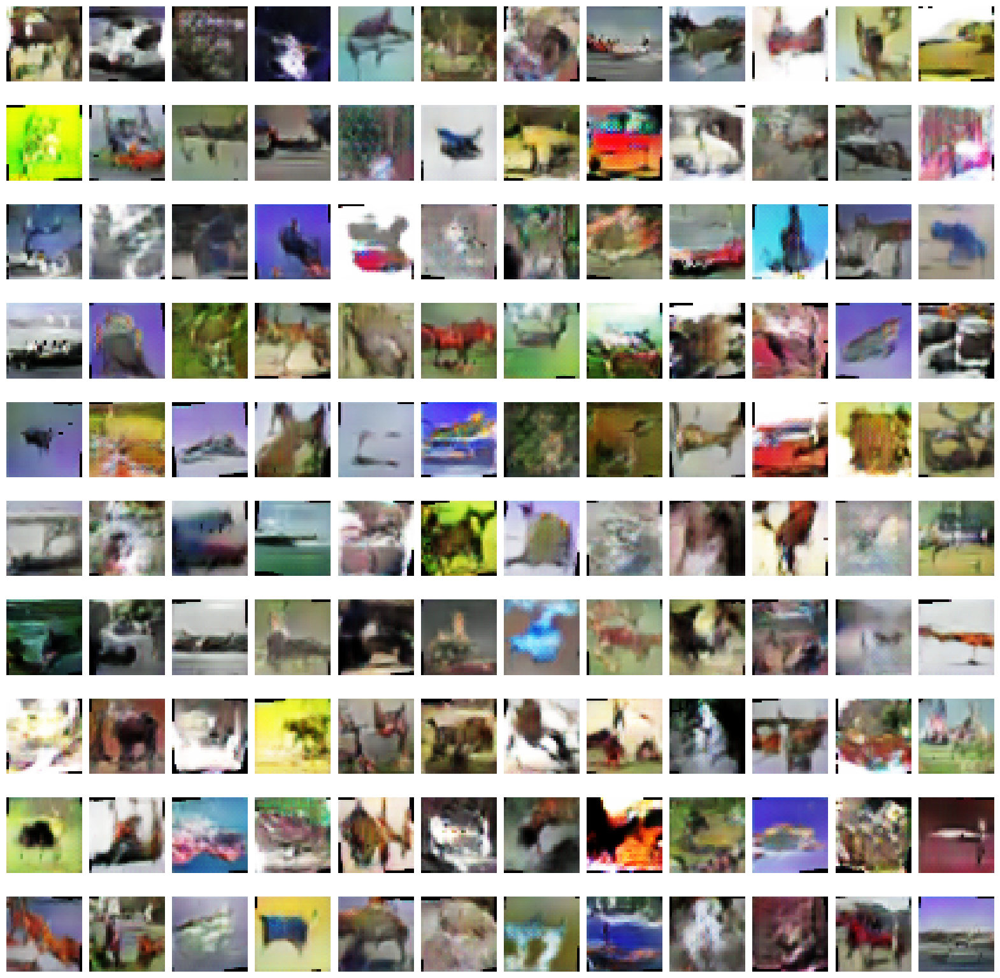

Epoch [251/1001] Loss D: 2.81971, Loss G: 0.56190
Epoch [252/1001] Loss D: 2.39049, Loss G: 0.27458
Epoch [253/1001] Loss D: 1.06429, Loss G: 0.33301
Epoch [254/1001] Loss D: 0.59070, Loss G: 0.90366
Epoch [255/1001] Loss D: 0.89084, Loss G: 0.91851
Epoch [256/1001] Loss D: 2.80737, Loss G: 0.08717
Epoch [257/1001] Loss D: 1.24225, Loss G: 1.11275
Epoch [258/1001] Loss D: 0.80800, Loss G: 3.47252
Epoch [259/1001] Loss D: 1.82168, Loss G: 0.16474
Epoch [260/1001] Loss D: 0.46126, Loss G: 0.35547
Epoch [261/1001] Loss D: 1.83241, Loss G: 0.30044
Epoch [262/1001] Loss D: 2.10302, Loss G: 0.61620
Epoch [263/1001] Loss D: 3.10488, Loss G: 0.46864
Epoch [264/1001] Loss D: 0.45521, Loss G: 0.19717
Epoch [265/1001] Loss D: 0.36670, Loss G: 0.47874
Epoch [266/1001] Loss D: 1.59760, Loss G: 0.51712
Epoch [267/1001] Loss D: 1.32759, Loss G: 0.50339
Epoch [268/1001] Loss D: 0.97349, Loss G: 0.37613
Epoch [269/1001] Loss D: 2.17411, Loss G: 0.60891
Epoch [270/1001] Loss D: 1.49655, Loss G: 1.57693


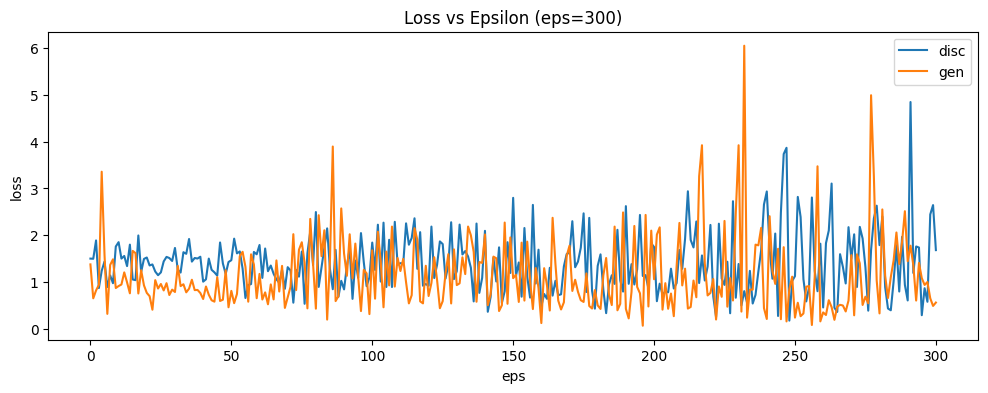

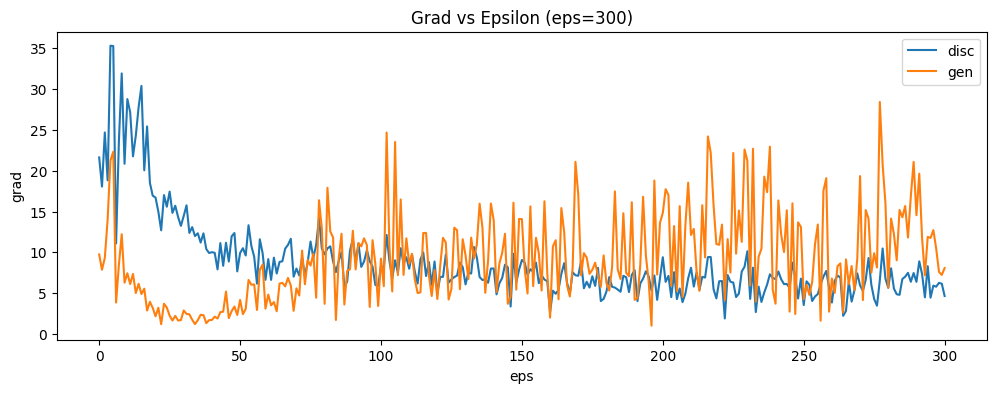

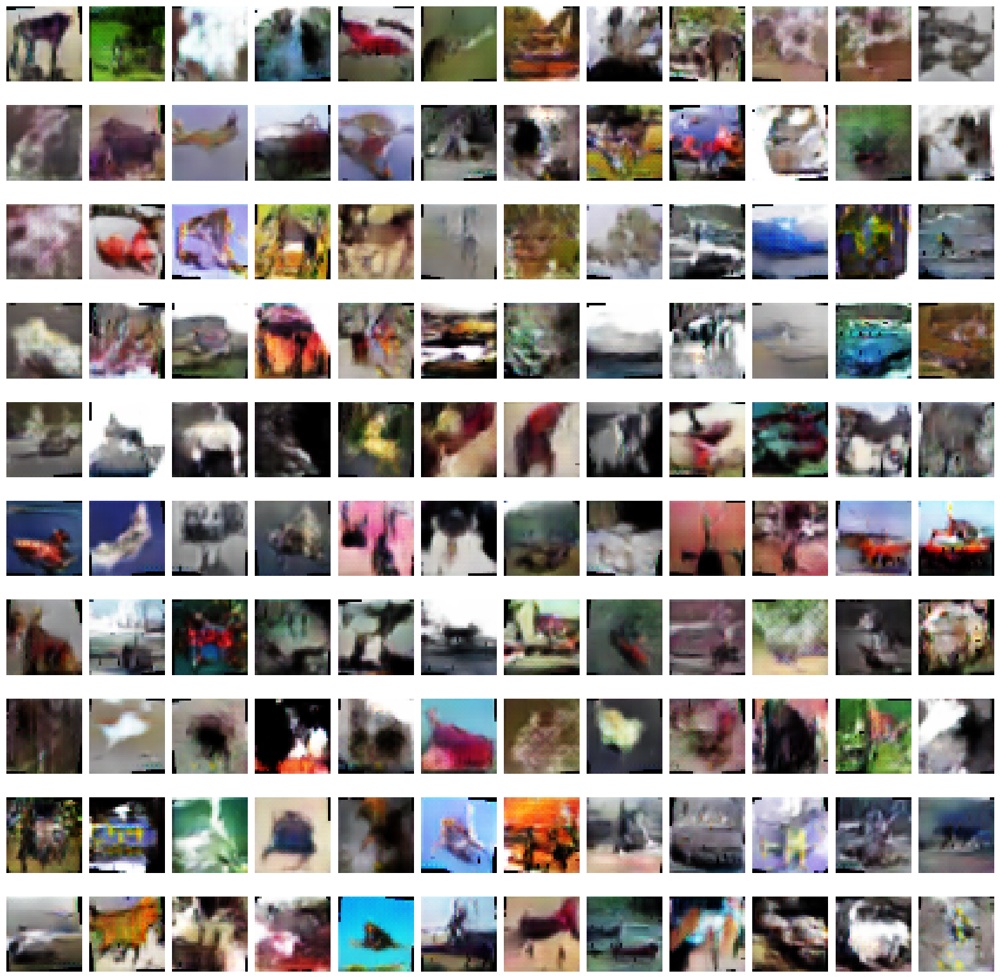

Epoch [301/1001] Loss D: 1.07958, Loss G: 0.31150
Epoch [302/1001] Loss D: 0.93142, Loss G: 0.50677
Epoch [303/1001] Loss D: 1.56252, Loss G: 0.89247
Epoch [304/1001] Loss D: 1.60349, Loss G: 0.17966
Epoch [305/1001] Loss D: 0.69216, Loss G: 1.85792
Epoch [306/1001] Loss D: 1.94912, Loss G: 1.38105
Epoch [307/1001] Loss D: 1.39236, Loss G: 1.45347
Epoch [308/1001] Loss D: 1.50151, Loss G: 1.90032
Epoch [309/1001] Loss D: 1.09893, Loss G: 1.66387
Epoch [310/1001] Loss D: 2.14096, Loss G: 1.39391
Epoch [311/1001] Loss D: 0.42512, Loss G: 0.27877
Epoch [312/1001] Loss D: 0.47724, Loss G: 0.79228
Epoch [313/1001] Loss D: 0.95273, Loss G: 0.25864
Epoch [314/1001] Loss D: 1.00545, Loss G: 0.99437
Epoch [315/1001] Loss D: 0.52429, Loss G: 0.27122
Epoch [316/1001] Loss D: 2.54200, Loss G: 1.77535
Epoch [317/1001] Loss D: 1.16142, Loss G: 0.73215
Epoch [318/1001] Loss D: 0.41403, Loss G: 1.30984
Epoch [319/1001] Loss D: 1.01454, Loss G: 0.29899
Epoch [320/1001] Loss D: 1.68099, Loss G: 3.27653


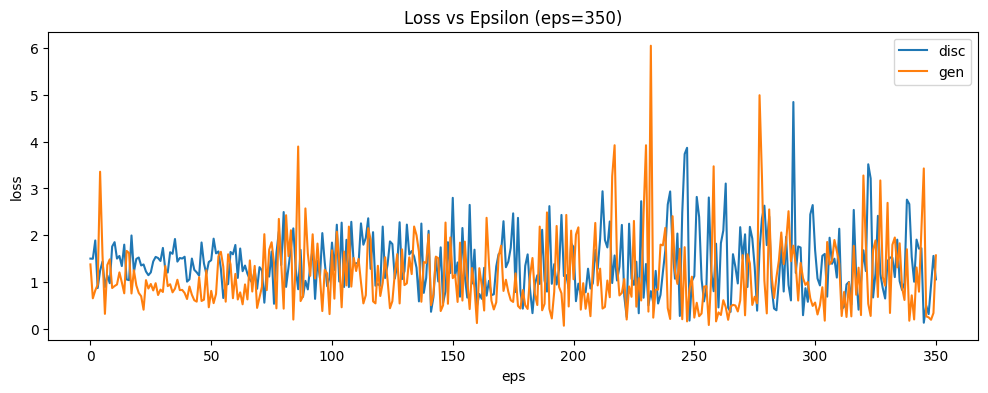

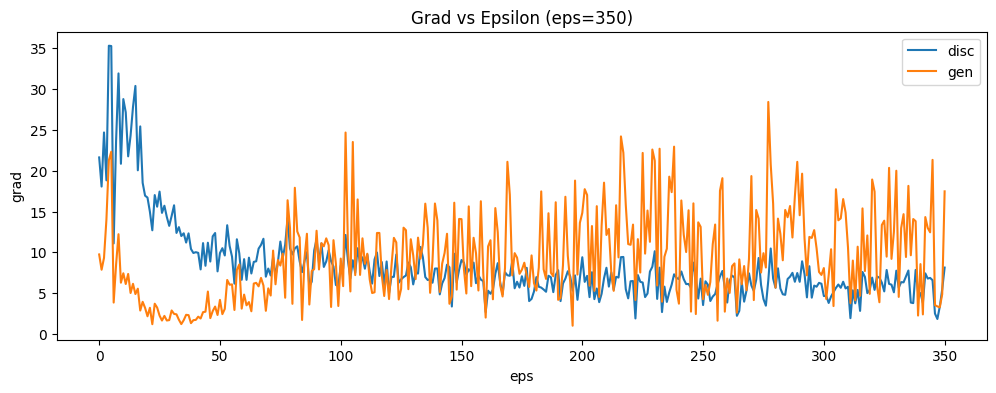

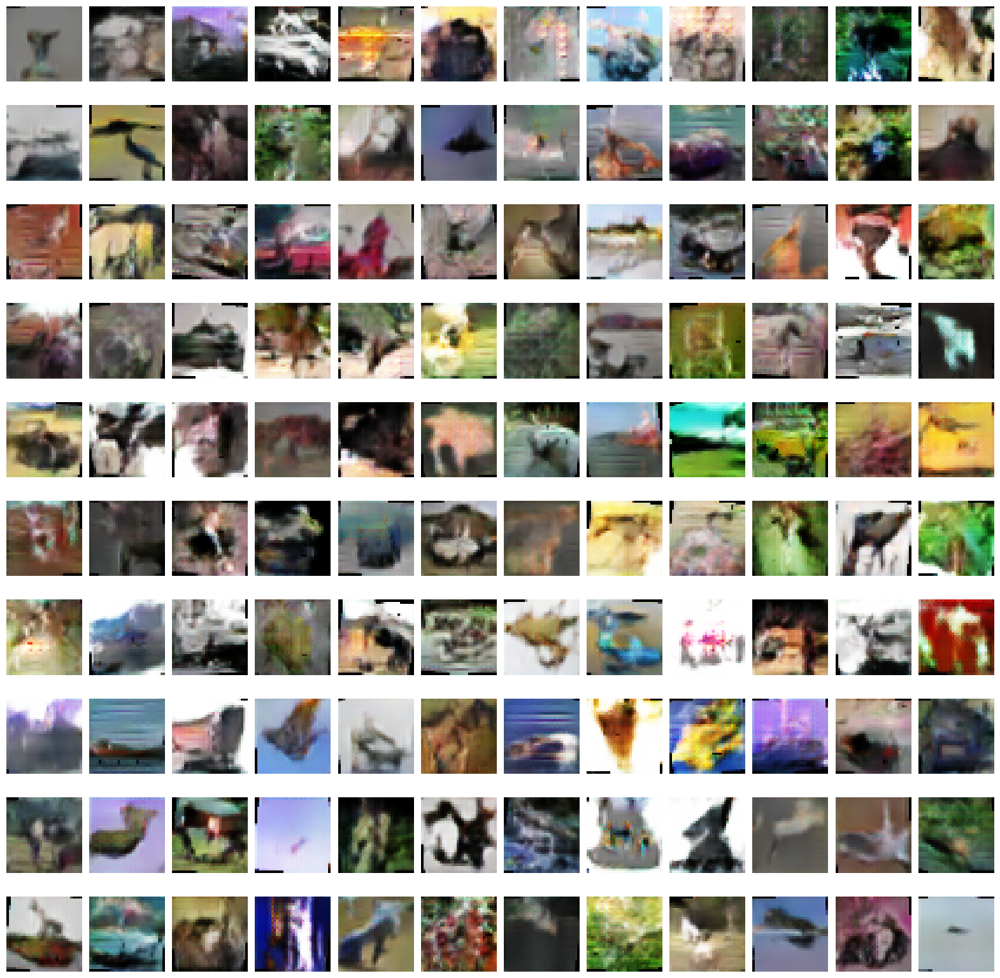

Epoch [351/1001] Loss D: 0.56957, Loss G: 0.26776
Epoch [352/1001] Loss D: 1.63409, Loss G: 1.01292
Epoch [353/1001] Loss D: 3.09848, Loss G: 2.26182
Epoch [354/1001] Loss D: 1.12658, Loss G: 0.18989
Epoch [355/1001] Loss D: 0.56558, Loss G: 1.12195
Epoch [356/1001] Loss D: 1.63434, Loss G: 0.54009
Epoch [357/1001] Loss D: 2.24425, Loss G: 1.51367
Epoch [358/1001] Loss D: 1.31206, Loss G: 0.20163
Epoch [359/1001] Loss D: 2.88516, Loss G: 1.41305
Epoch [360/1001] Loss D: 1.82562, Loss G: 0.86979
Epoch [361/1001] Loss D: 1.66036, Loss G: 1.43537
Epoch [362/1001] Loss D: 0.53631, Loss G: 0.22922
Epoch [363/1001] Loss D: 0.69643, Loss G: 0.45337
Epoch [364/1001] Loss D: 1.53432, Loss G: 1.78166
Epoch [365/1001] Loss D: 1.69483, Loss G: 1.24986
Epoch [366/1001] Loss D: 1.73920, Loss G: 0.31344
Epoch [367/1001] Loss D: 0.78331, Loss G: 0.78227
Epoch [368/1001] Loss D: 1.43073, Loss G: 0.31495
Epoch [369/1001] Loss D: 0.62775, Loss G: 2.17353
Epoch [370/1001] Loss D: 2.86801, Loss G: 0.20670


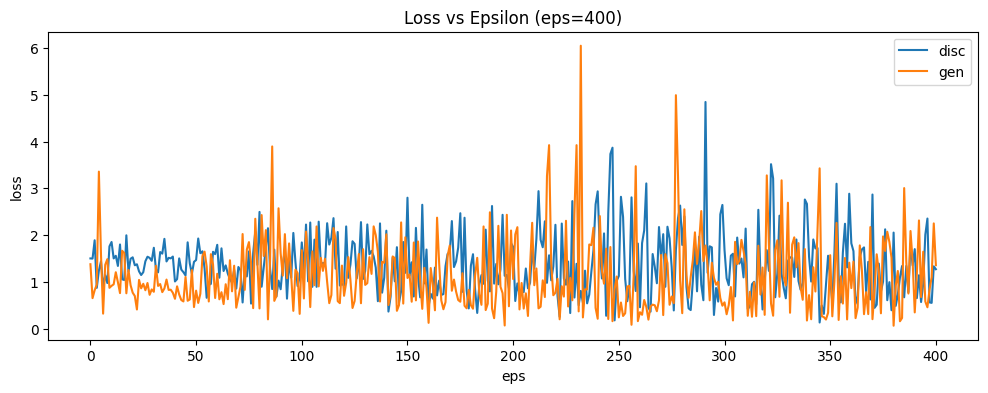

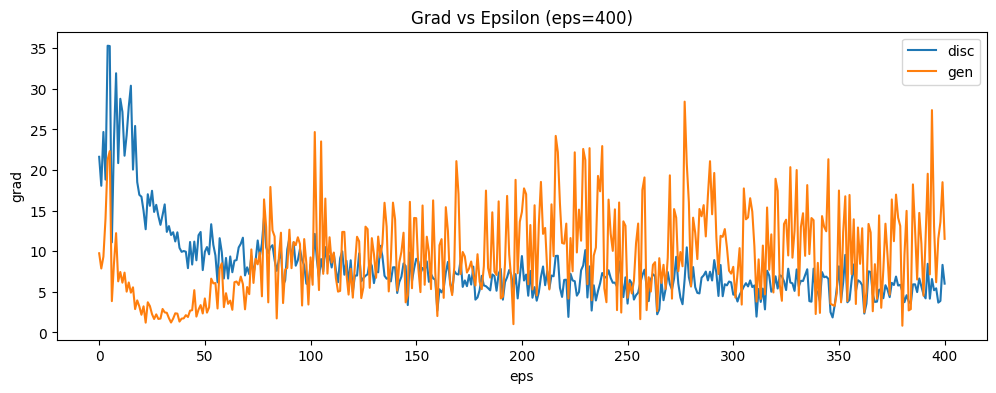

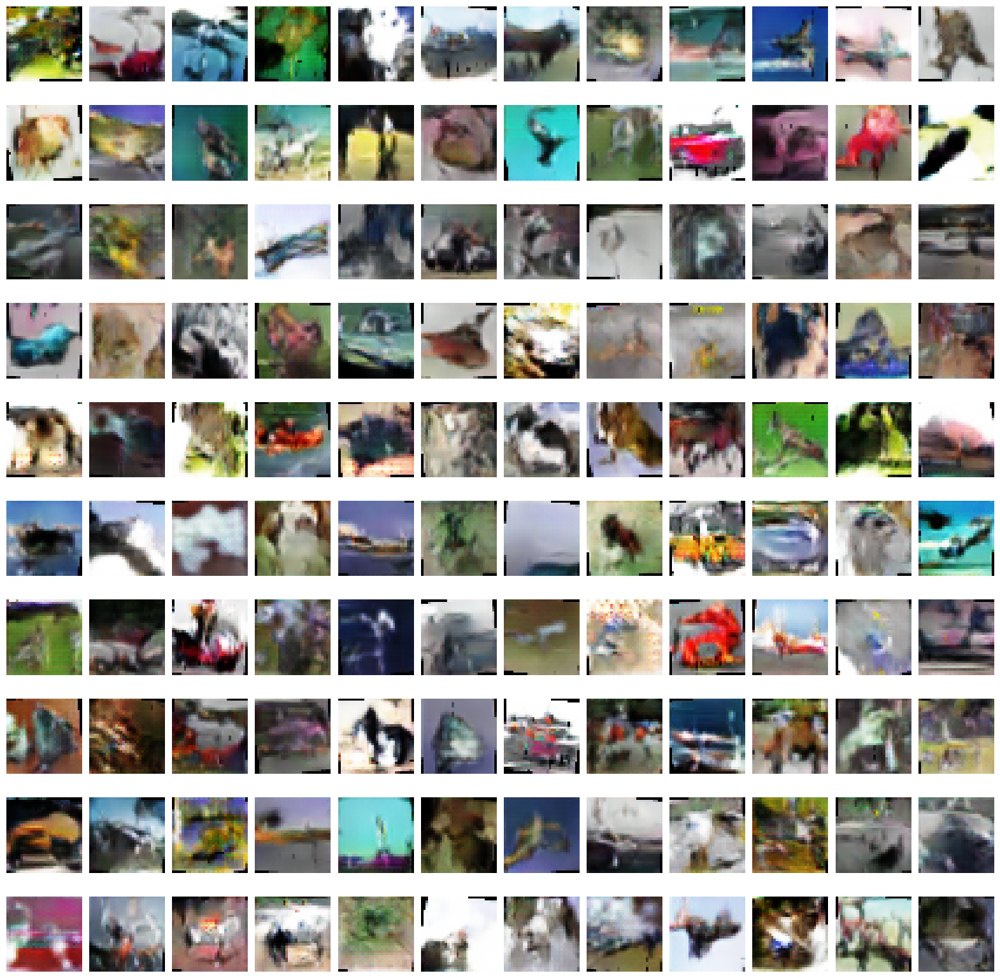

Epoch [401/1001] Loss D: 0.96605, Loss G: 0.53429
Epoch [402/1001] Loss D: 1.16524, Loss G: 1.29688
Epoch [403/1001] Loss D: 1.29800, Loss G: 0.94016
Epoch [404/1001] Loss D: 1.69387, Loss G: 0.11861
Epoch [405/1001] Loss D: 0.36733, Loss G: 1.49971
Epoch [406/1001] Loss D: 4.79914, Loss G: 1.43848
Epoch [407/1001] Loss D: 1.97411, Loss G: 1.75973
Epoch [408/1001] Loss D: 1.34177, Loss G: 0.43358
Epoch [409/1001] Loss D: 1.45451, Loss G: 1.21084
Epoch [410/1001] Loss D: 0.66615, Loss G: 2.03424
Epoch [411/1001] Loss D: 0.68109, Loss G: 2.50755
Epoch [412/1001] Loss D: 0.67359, Loss G: 0.15227
Epoch [413/1001] Loss D: 0.47191, Loss G: 0.73538
Epoch [414/1001] Loss D: 0.84862, Loss G: 1.18395
Epoch [415/1001] Loss D: 0.99465, Loss G: 1.33343
Epoch [416/1001] Loss D: 1.02591, Loss G: 0.91109
Epoch [417/1001] Loss D: 1.07383, Loss G: 0.28027
Epoch [418/1001] Loss D: 0.72743, Loss G: 0.86236
Epoch [419/1001] Loss D: 1.34522, Loss G: 0.80484
Epoch [420/1001] Loss D: 1.01886, Loss G: 2.41940


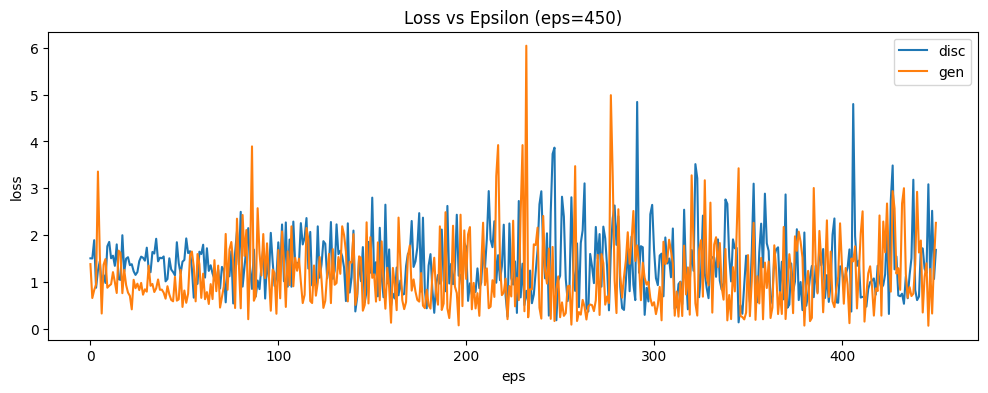

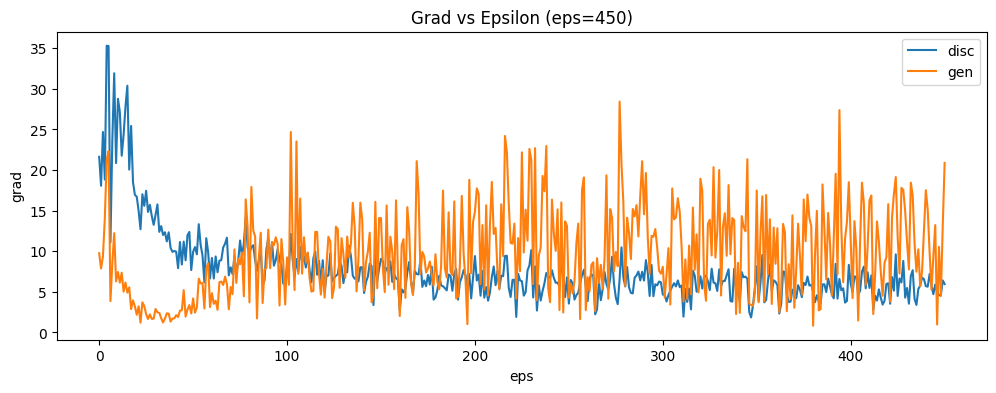

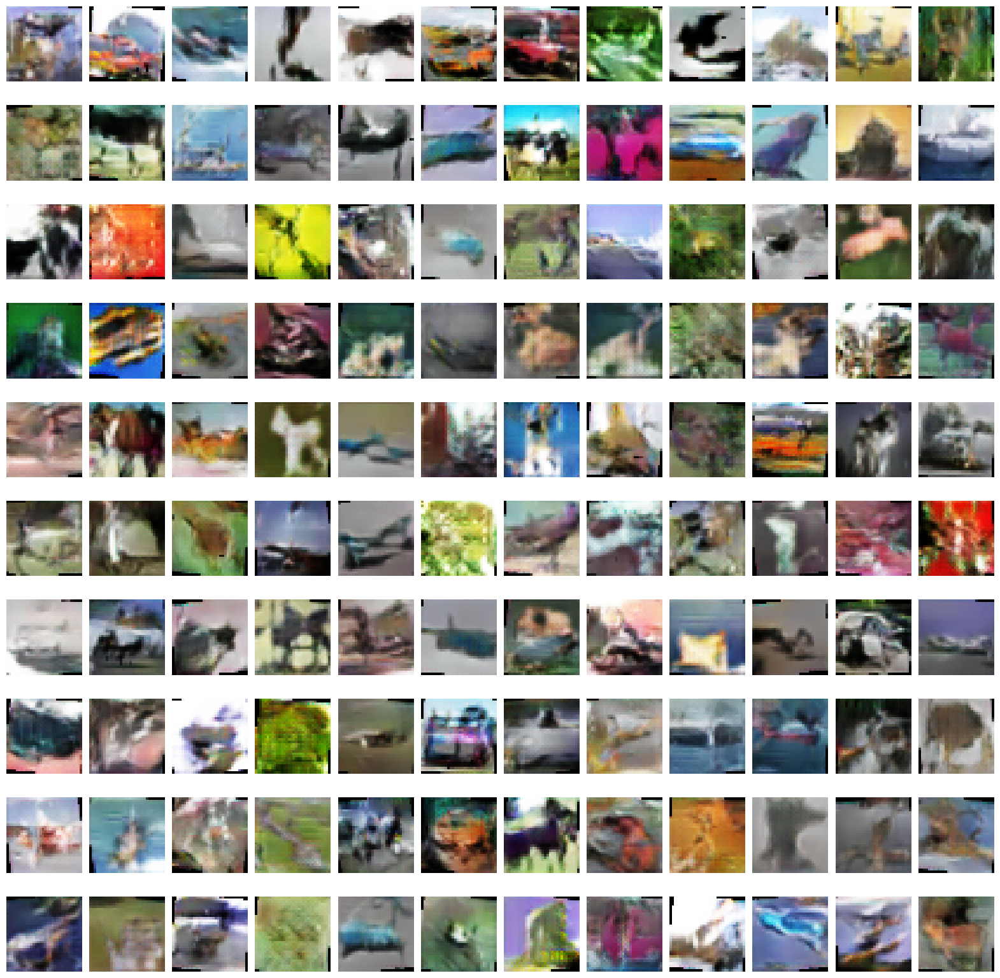

Epoch [451/1001] Loss D: 1.33269, Loss G: 2.73728
Epoch [452/1001] Loss D: 1.40950, Loss G: 3.16126
Epoch [453/1001] Loss D: 1.30339, Loss G: 2.27732
Epoch [454/1001] Loss D: 0.88141, Loss G: 4.00972
Epoch [455/1001] Loss D: 2.74964, Loss G: 0.32485
Epoch [456/1001] Loss D: 0.74422, Loss G: 0.87551
Epoch [457/1001] Loss D: 0.88232, Loss G: 0.35091
Epoch [458/1001] Loss D: 2.60026, Loss G: 0.16546
Epoch [459/1001] Loss D: 0.78473, Loss G: 1.66087
Epoch [460/1001] Loss D: 0.78166, Loss G: 1.58319
Epoch [461/1001] Loss D: 2.17956, Loss G: 1.78683
Epoch [462/1001] Loss D: 1.64433, Loss G: 1.25090
Epoch [463/1001] Loss D: 1.19631, Loss G: 2.00685
Epoch [464/1001] Loss D: 0.38322, Loss G: 0.31144
Epoch [465/1001] Loss D: 1.56005, Loss G: 0.76027
Epoch [466/1001] Loss D: 3.37534, Loss G: 1.45168
Epoch [467/1001] Loss D: 1.62189, Loss G: 0.88340
Epoch [468/1001] Loss D: 1.06171, Loss G: 0.89624
Epoch [469/1001] Loss D: 0.52873, Loss G: 2.10407
Epoch [470/1001] Loss D: 2.27207, Loss G: 1.52554


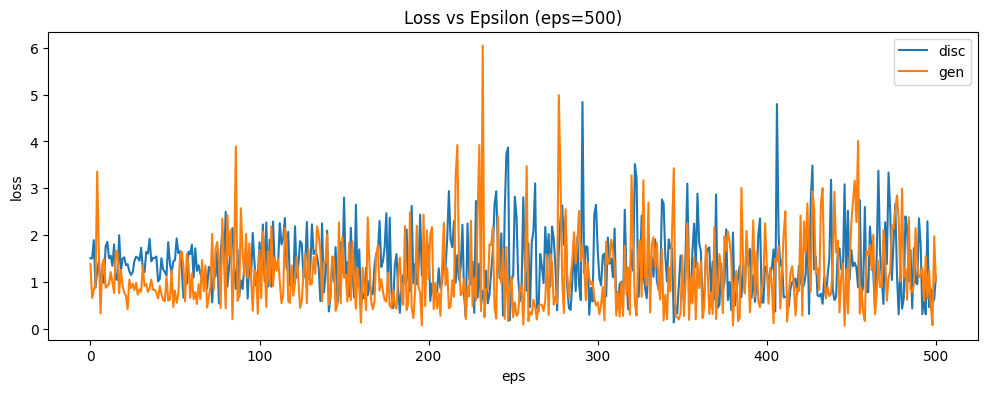

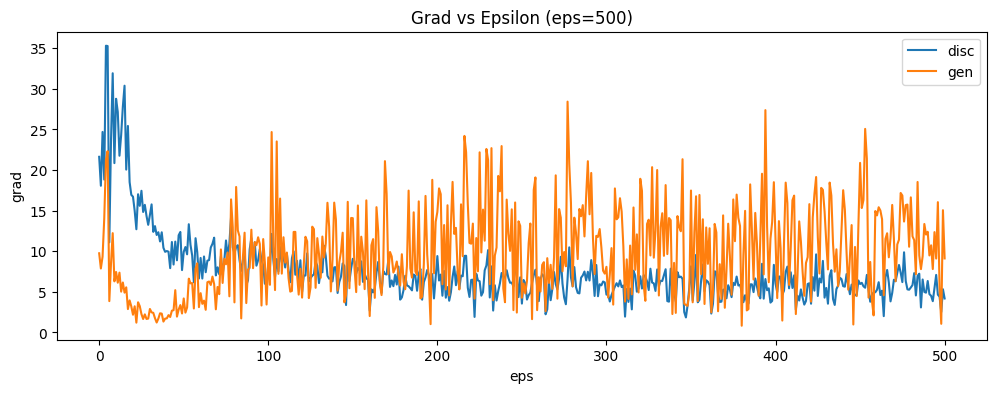

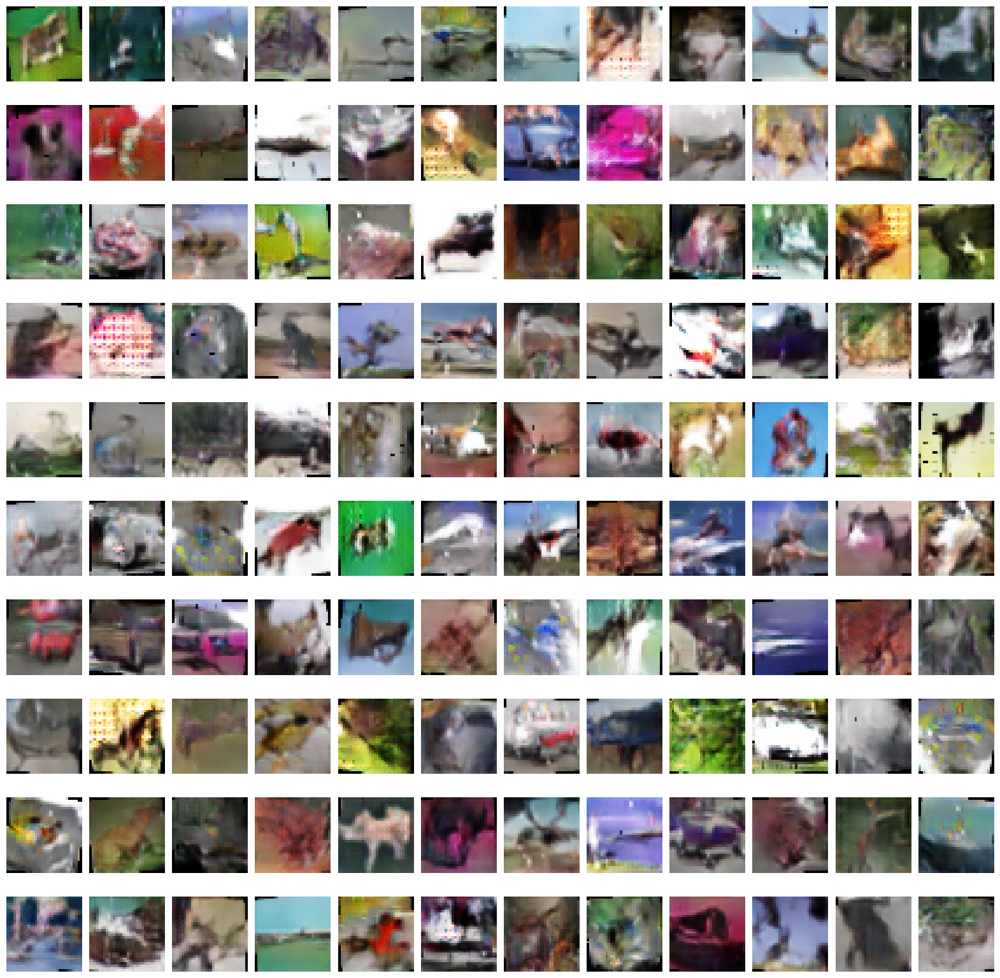

Epoch [501/1001] Loss D: 1.40590, Loss G: 1.21086
Epoch [502/1001] Loss D: 0.68835, Loss G: 0.58943
Epoch [503/1001] Loss D: 0.69971, Loss G: 0.50249
Epoch [504/1001] Loss D: 0.81117, Loss G: 3.12779
Epoch [505/1001] Loss D: 3.01468, Loss G: 0.48324
Epoch [506/1001] Loss D: 1.41819, Loss G: 1.03065
Epoch [507/1001] Loss D: 1.54053, Loss G: 2.22363
Epoch [508/1001] Loss D: 1.13270, Loss G: 2.06660
Epoch [509/1001] Loss D: 1.34542, Loss G: 1.25627
Epoch [510/1001] Loss D: 1.60523, Loss G: 1.18679
Epoch [511/1001] Loss D: 1.00252, Loss G: 0.49966
Epoch [512/1001] Loss D: 0.69650, Loss G: 0.36452
Epoch [513/1001] Loss D: 1.17456, Loss G: 0.39410
Epoch [514/1001] Loss D: 0.40954, Loss G: 2.80539
Epoch [515/1001] Loss D: 2.80796, Loss G: 0.37183
Epoch [516/1001] Loss D: 0.79530, Loss G: 1.36494
Epoch [517/1001] Loss D: 1.38432, Loss G: 0.62594
Epoch [518/1001] Loss D: 1.35582, Loss G: 2.07472
Epoch [519/1001] Loss D: 0.47494, Loss G: 5.43821
Epoch [520/1001] Loss D: 1.11818, Loss G: 3.18698


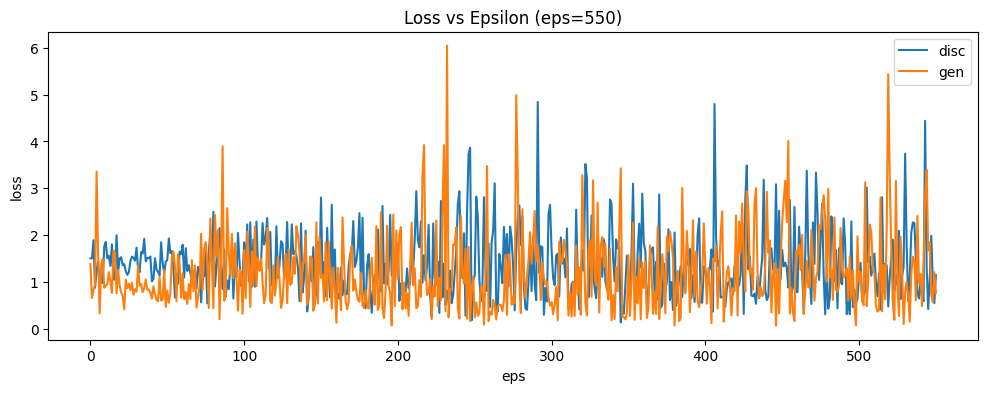

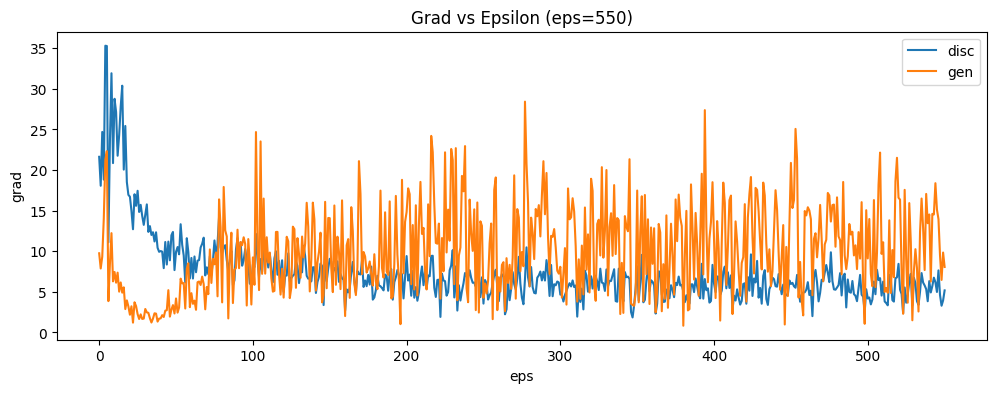

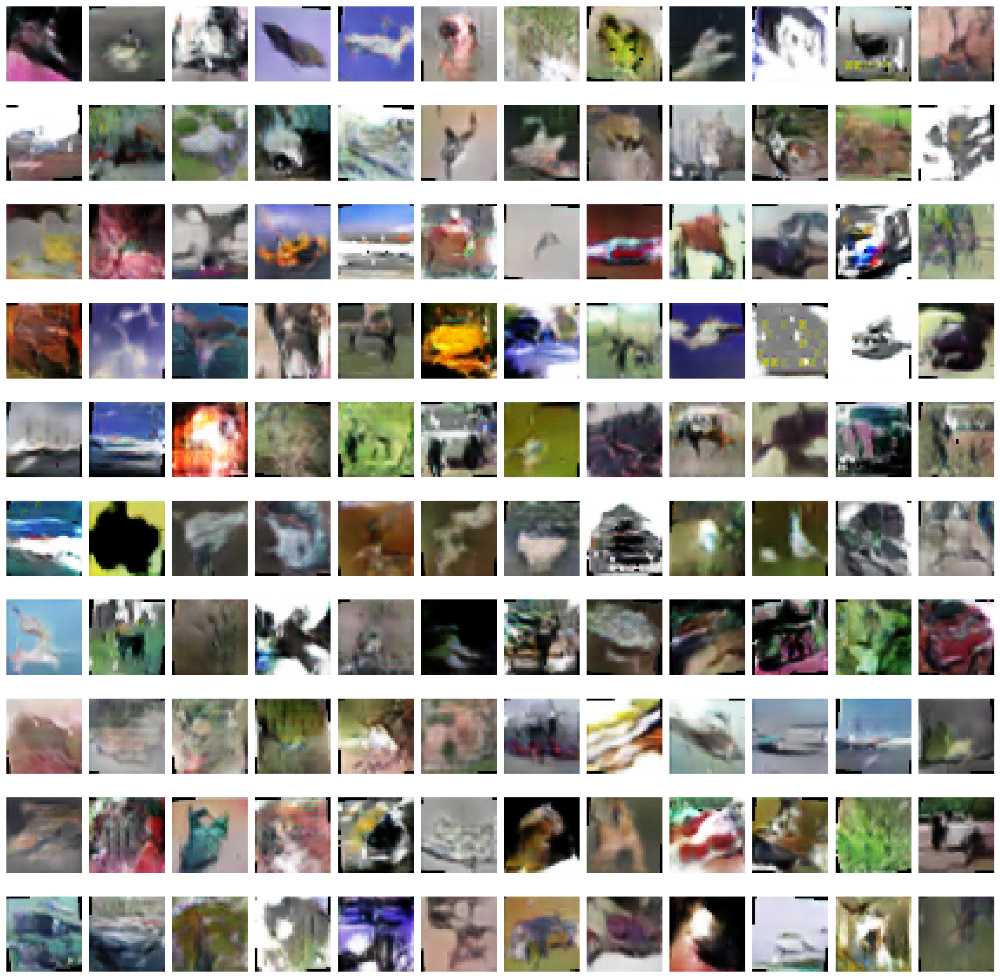

Epoch [551/1001] Loss D: 1.98879, Loss G: 0.30922
Epoch [552/1001] Loss D: 0.56499, Loss G: 2.53264
Epoch [553/1001] Loss D: 0.40109, Loss G: 2.56520
Epoch [554/1001] Loss D: 1.72680, Loss G: 2.94625
Epoch [555/1001] Loss D: 0.66590, Loss G: 1.40058
Epoch [556/1001] Loss D: 2.45688, Loss G: 1.09147
Epoch [557/1001] Loss D: 0.80260, Loss G: 0.14301
Epoch [558/1001] Loss D: 1.05366, Loss G: 2.59273
Epoch [559/1001] Loss D: 0.85831, Loss G: 0.77034
Epoch [560/1001] Loss D: 3.20303, Loss G: 0.39237
Epoch [561/1001] Loss D: 2.10517, Loss G: 1.21670
Epoch [562/1001] Loss D: 3.17159, Loss G: 1.38972
Epoch [563/1001] Loss D: 0.57564, Loss G: 1.79205
Epoch [564/1001] Loss D: 1.82467, Loss G: 1.27854
Epoch [565/1001] Loss D: 2.56182, Loss G: 0.76139
Epoch [566/1001] Loss D: 0.53733, Loss G: 0.97986
Epoch [567/1001] Loss D: 1.02790, Loss G: 0.68572
Epoch [568/1001] Loss D: 1.05357, Loss G: 1.66589
Epoch [569/1001] Loss D: 2.87654, Loss G: 0.17933
Epoch [570/1001] Loss D: 1.39982, Loss G: 0.61119


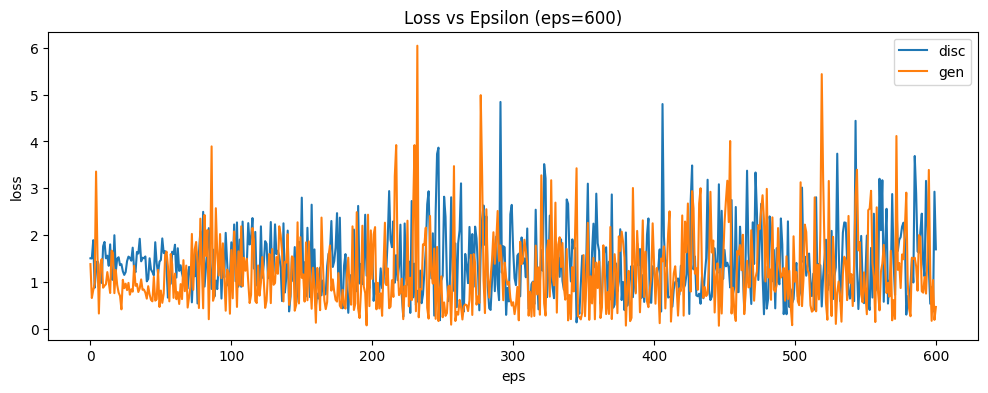

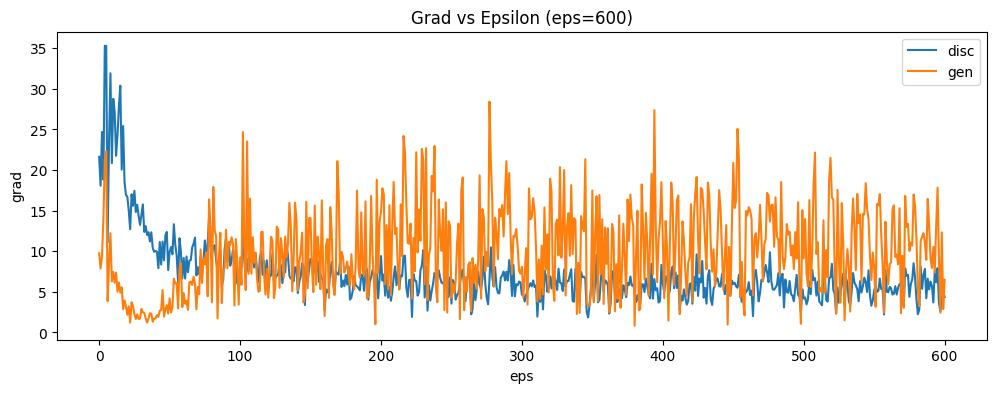

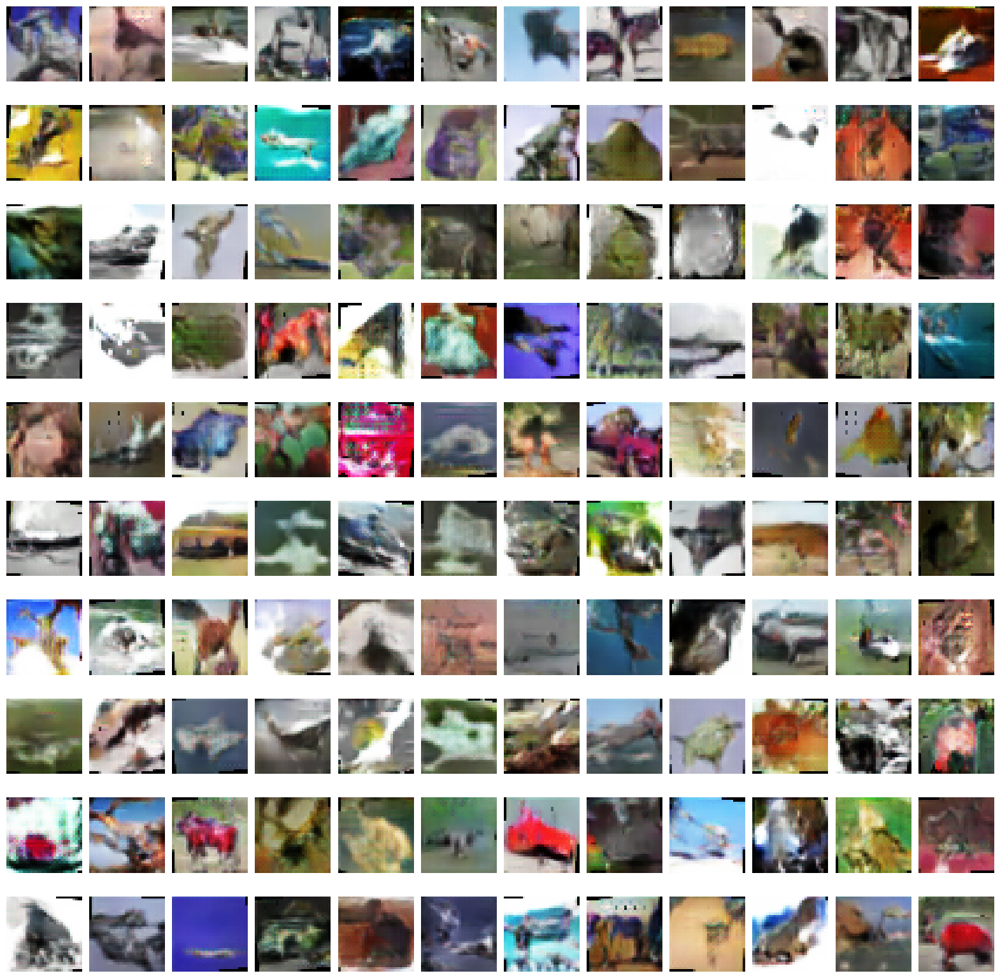

Epoch [601/1001] Loss D: 3.39044, Loss G: 0.88019
Epoch [602/1001] Loss D: 1.50427, Loss G: 2.34254
Epoch [603/1001] Loss D: 1.88285, Loss G: 0.77491
Epoch [604/1001] Loss D: 0.80900, Loss G: 0.78871
Epoch [605/1001] Loss D: 0.93257, Loss G: 1.36301
Epoch [606/1001] Loss D: 1.02721, Loss G: 2.43150
Epoch [607/1001] Loss D: 2.01390, Loss G: 0.40560
Epoch [608/1001] Loss D: 1.89305, Loss G: 1.00044
Epoch [609/1001] Loss D: 0.52253, Loss G: 0.04734
Epoch [610/1001] Loss D: 0.66223, Loss G: 2.65961
Epoch [611/1001] Loss D: 1.60716, Loss G: 0.76832
Epoch [612/1001] Loss D: 1.73883, Loss G: 2.52719
Epoch [613/1001] Loss D: 3.58974, Loss G: 0.73189
Epoch [614/1001] Loss D: 2.77345, Loss G: 1.46345
Epoch [615/1001] Loss D: 1.86651, Loss G: 0.63323
Epoch [616/1001] Loss D: 1.59790, Loss G: 1.69586
Epoch [617/1001] Loss D: 0.75160, Loss G: 0.40935
Epoch [618/1001] Loss D: 2.38480, Loss G: 0.30854
Epoch [619/1001] Loss D: 0.72492, Loss G: 1.67568
Epoch [620/1001] Loss D: 2.11370, Loss G: 0.84682


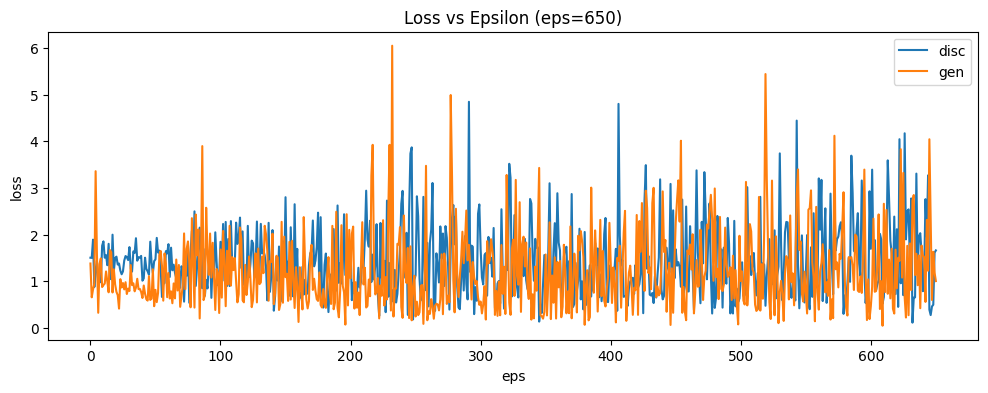

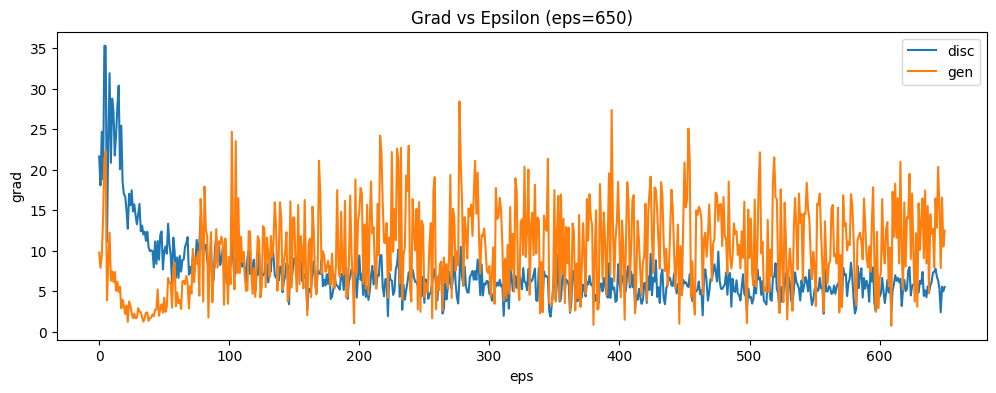

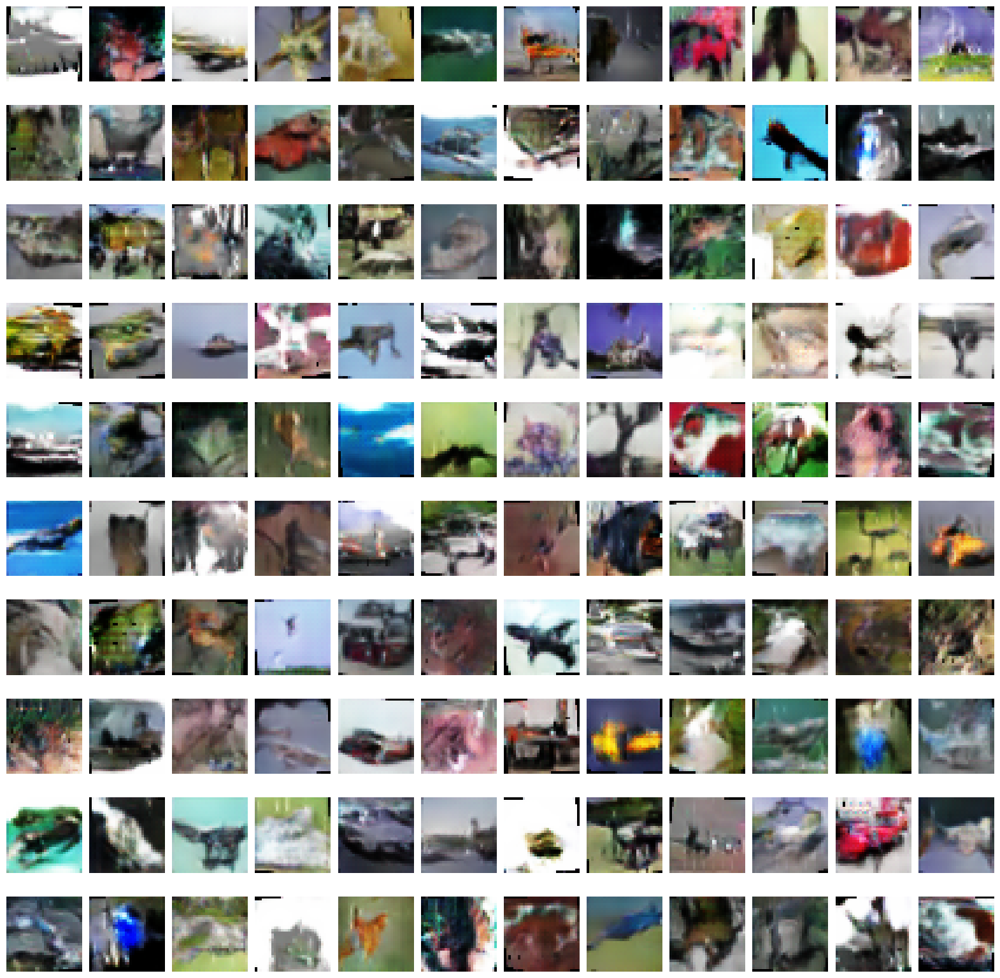

Epoch [651/1001] Loss D: 1.36092, Loss G: 2.82782
Epoch [652/1001] Loss D: 3.34827, Loss G: 1.56571
Epoch [653/1001] Loss D: 0.83744, Loss G: 1.28198
Epoch [654/1001] Loss D: 0.76762, Loss G: 0.66031
Epoch [655/1001] Loss D: 0.75259, Loss G: 1.63653
Epoch [656/1001] Loss D: 0.85569, Loss G: 1.29673
Epoch [657/1001] Loss D: 0.40755, Loss G: 5.55642
Epoch [658/1001] Loss D: 0.46223, Loss G: 0.75236
Epoch [659/1001] Loss D: 1.11250, Loss G: 0.60811
Epoch [660/1001] Loss D: 0.60907, Loss G: 2.44761
Epoch [661/1001] Loss D: 0.65974, Loss G: 0.09371
Epoch [662/1001] Loss D: 1.49866, Loss G: 0.54920
Epoch [663/1001] Loss D: 1.18567, Loss G: 1.44816
Epoch [664/1001] Loss D: 2.40224, Loss G: 1.41838
Epoch [665/1001] Loss D: 0.34956, Loss G: 2.37955
Epoch [666/1001] Loss D: 1.03487, Loss G: 1.90106
Epoch [667/1001] Loss D: 2.46332, Loss G: 2.47981
Epoch [668/1001] Loss D: 1.79442, Loss G: 1.07207
Epoch [669/1001] Loss D: 0.41808, Loss G: 0.57892
Epoch [670/1001] Loss D: 3.02370, Loss G: 1.80871


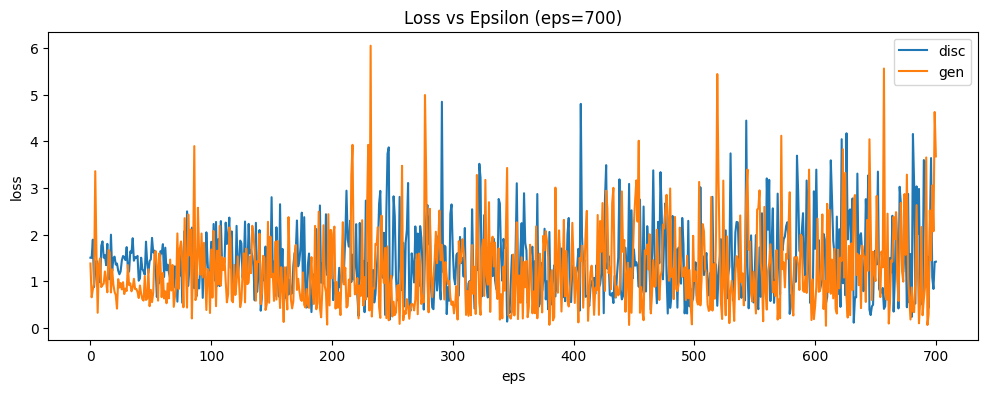

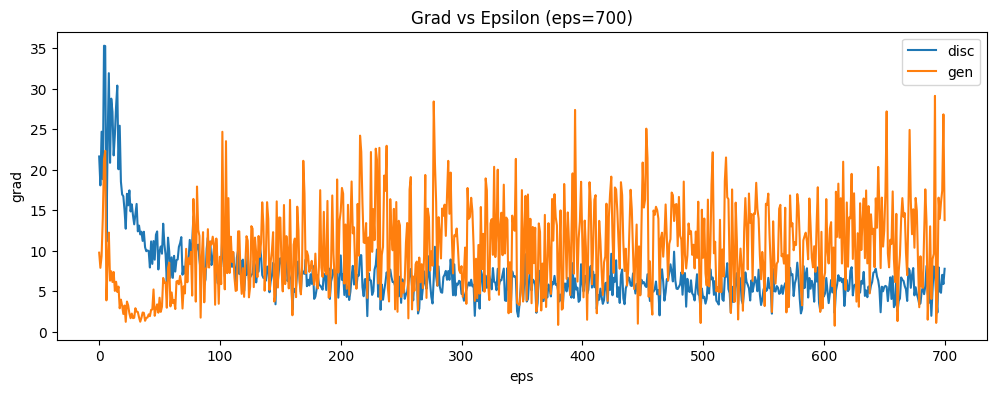

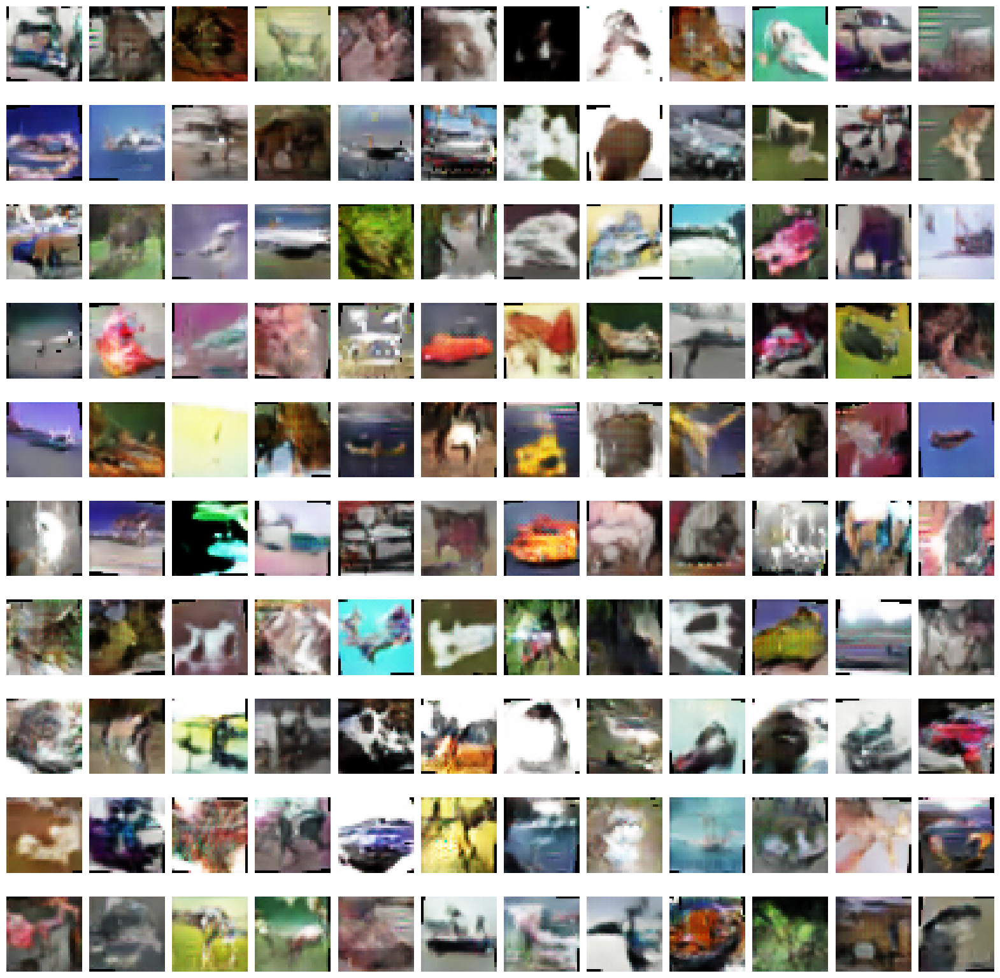

Epoch [701/1001] Loss D: 1.56419, Loss G: 0.39321
Epoch [702/1001] Loss D: 4.03411, Loss G: 1.02832
Epoch [703/1001] Loss D: 2.26281, Loss G: 2.40067
Epoch [704/1001] Loss D: 0.94272, Loss G: 0.12900
Epoch [705/1001] Loss D: 3.44595, Loss G: 1.06749
Epoch [706/1001] Loss D: 1.44184, Loss G: 0.69720
Epoch [707/1001] Loss D: 2.50607, Loss G: 1.27726
Epoch [708/1001] Loss D: 0.29336, Loss G: 1.24651
Epoch [709/1001] Loss D: 3.01027, Loss G: 0.90419
Epoch [710/1001] Loss D: 1.79125, Loss G: 0.48830
Epoch [711/1001] Loss D: 0.90165, Loss G: 0.99555
Epoch [712/1001] Loss D: 0.32569, Loss G: 0.29599
Epoch [713/1001] Loss D: 1.52519, Loss G: 2.65281
Epoch [714/1001] Loss D: 0.19105, Loss G: 2.12924
Epoch [715/1001] Loss D: 0.42695, Loss G: 2.59877
Epoch [716/1001] Loss D: 1.05823, Loss G: 2.87773
Epoch [717/1001] Loss D: 0.70190, Loss G: 1.38470
Epoch [718/1001] Loss D: 1.51016, Loss G: 3.97506
Epoch [719/1001] Loss D: 4.33949, Loss G: 0.51986
Epoch [720/1001] Loss D: 1.77259, Loss G: 2.94755


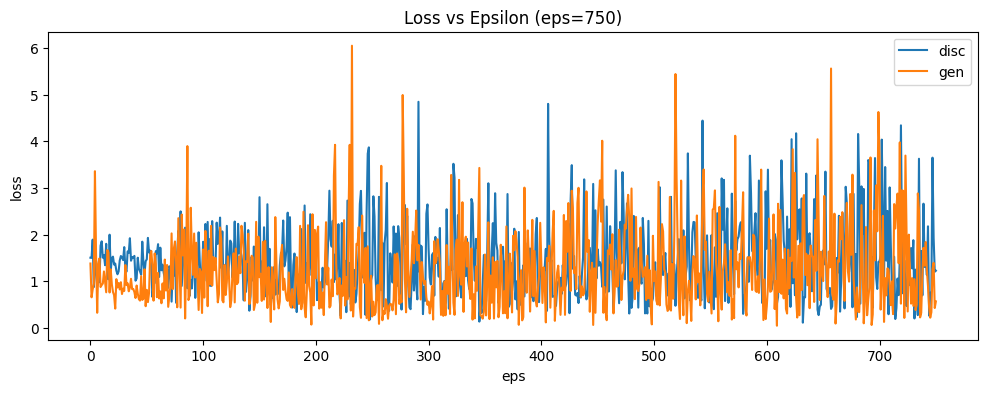

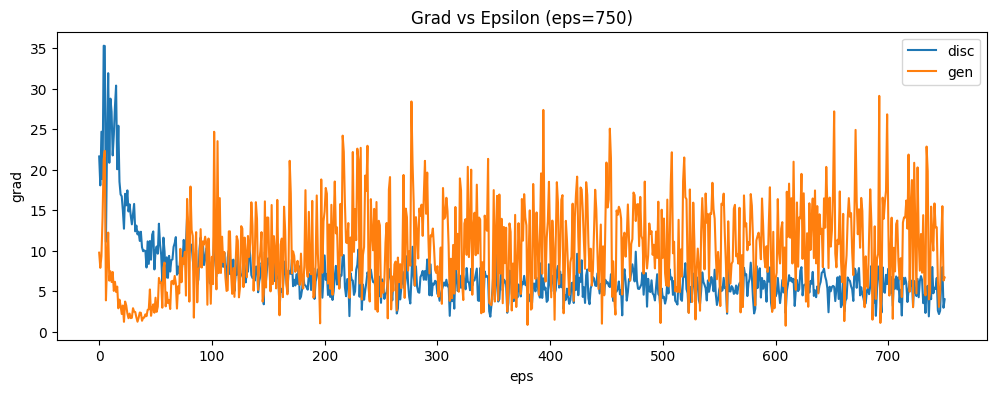

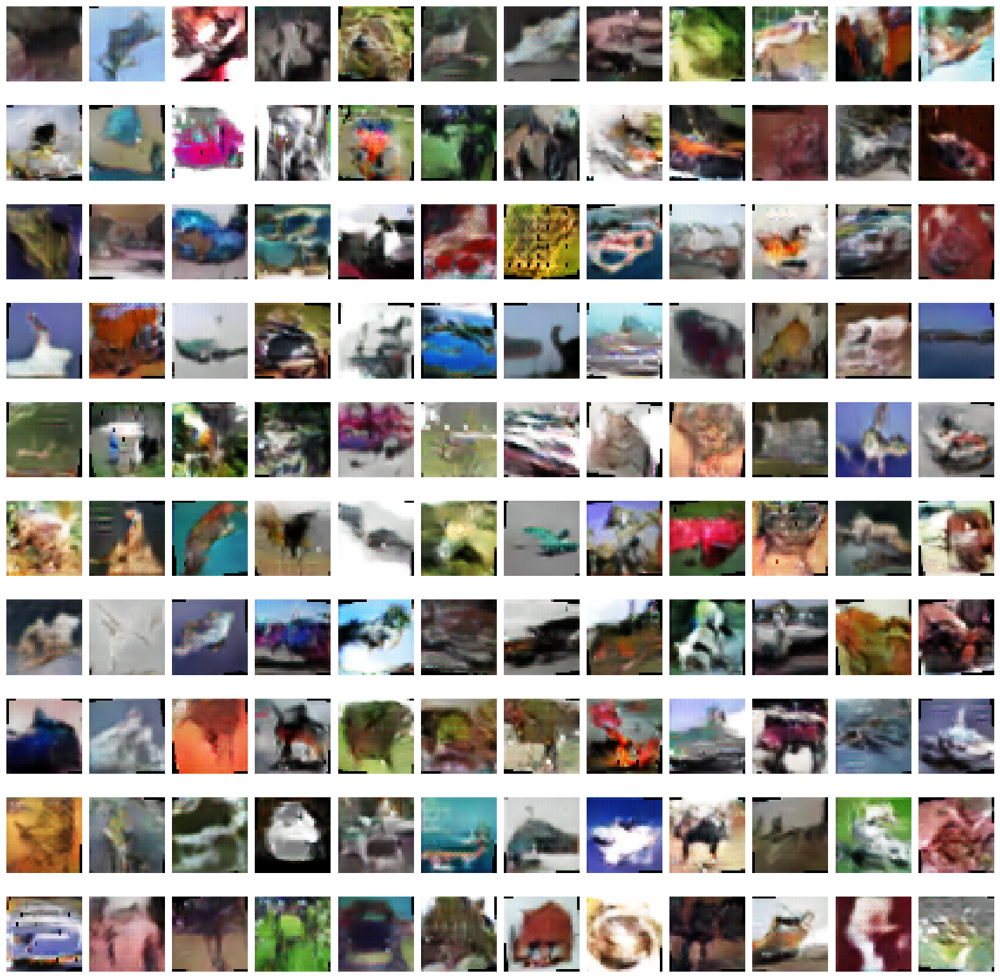

Epoch [751/1001] Loss D: 0.28419, Loss G: 0.63172
Epoch [752/1001] Loss D: 1.54483, Loss G: 0.81426
Epoch [753/1001] Loss D: 0.87401, Loss G: 0.25918
Epoch [754/1001] Loss D: 0.24764, Loss G: 2.58308
Epoch [755/1001] Loss D: 0.82704, Loss G: 1.60959
Epoch [756/1001] Loss D: 2.93084, Loss G: 2.03872
Epoch [757/1001] Loss D: 1.99256, Loss G: 3.95459
Epoch [758/1001] Loss D: 0.52296, Loss G: 0.97032
Epoch [759/1001] Loss D: 0.47513, Loss G: 2.99732
Epoch [760/1001] Loss D: 1.21948, Loss G: 0.80546
Epoch [761/1001] Loss D: 0.53687, Loss G: 2.53911
Epoch [762/1001] Loss D: 0.87278, Loss G: 0.96714
Epoch [763/1001] Loss D: 0.59022, Loss G: 2.02640
Epoch [764/1001] Loss D: 0.81228, Loss G: 2.14839
Epoch [765/1001] Loss D: 1.25710, Loss G: 2.05073
Epoch [766/1001] Loss D: 4.78215, Loss G: 0.64989
Epoch [767/1001] Loss D: 1.31484, Loss G: 3.16105
Epoch [768/1001] Loss D: 2.21696, Loss G: 0.19339
Epoch [769/1001] Loss D: 2.58686, Loss G: 0.68629
Epoch [770/1001] Loss D: 1.02317, Loss G: 1.16616


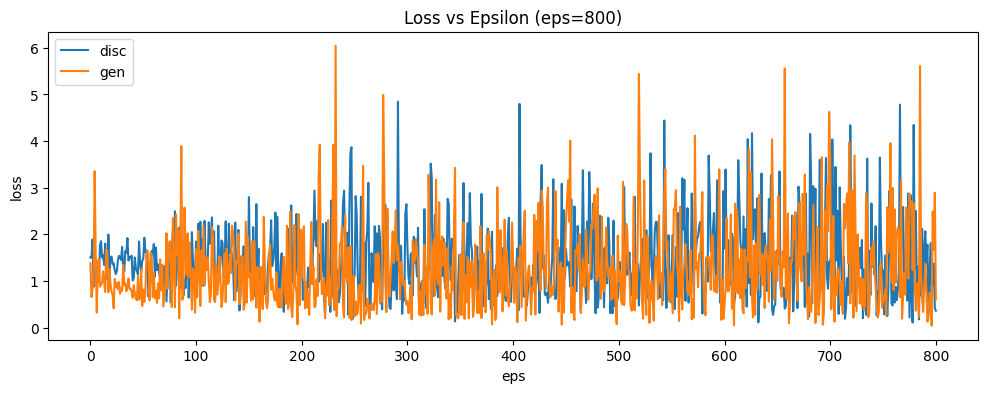

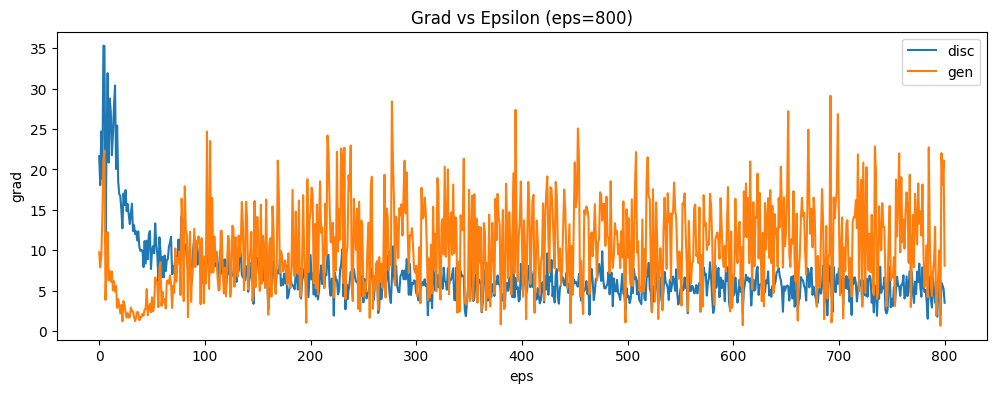

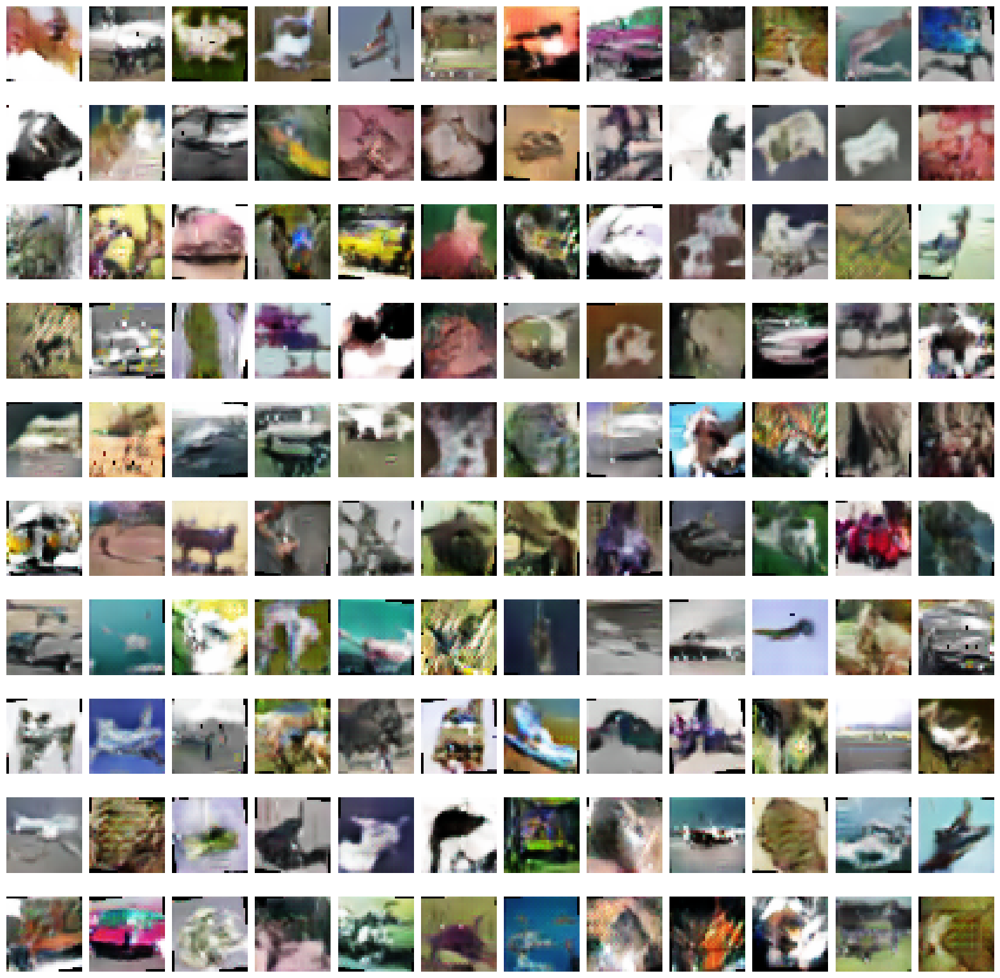

Epoch [801/1001] Loss D: 1.34285, Loss G: 0.25336
Epoch [802/1001] Loss D: 1.36881, Loss G: 1.23634
Epoch [803/1001] Loss D: 1.06671, Loss G: 0.37747
Epoch [804/1001] Loss D: 1.30349, Loss G: 0.96573
Epoch [805/1001] Loss D: 0.22122, Loss G: 2.21798
Epoch [806/1001] Loss D: 2.47493, Loss G: 0.76998
Epoch [807/1001] Loss D: 0.67766, Loss G: 1.56075
Epoch [808/1001] Loss D: 1.17640, Loss G: 0.55006
Epoch [809/1001] Loss D: 0.64880, Loss G: 0.73043
Epoch [810/1001] Loss D: 0.53336, Loss G: 2.31109
Epoch [811/1001] Loss D: 2.07439, Loss G: 0.04716
Epoch [812/1001] Loss D: 1.86701, Loss G: 1.23528
Epoch [813/1001] Loss D: 2.00306, Loss G: 2.23684
Epoch [814/1001] Loss D: 0.57472, Loss G: 0.73200
Epoch [815/1001] Loss D: 2.01187, Loss G: 0.77805
Epoch [816/1001] Loss D: 1.25085, Loss G: 0.61840
Epoch [817/1001] Loss D: 3.48687, Loss G: 0.71189
Epoch [818/1001] Loss D: 1.26826, Loss G: 0.51128
Epoch [819/1001] Loss D: 2.33600, Loss G: 0.63021
Epoch [820/1001] Loss D: 1.22330, Loss G: 0.13670


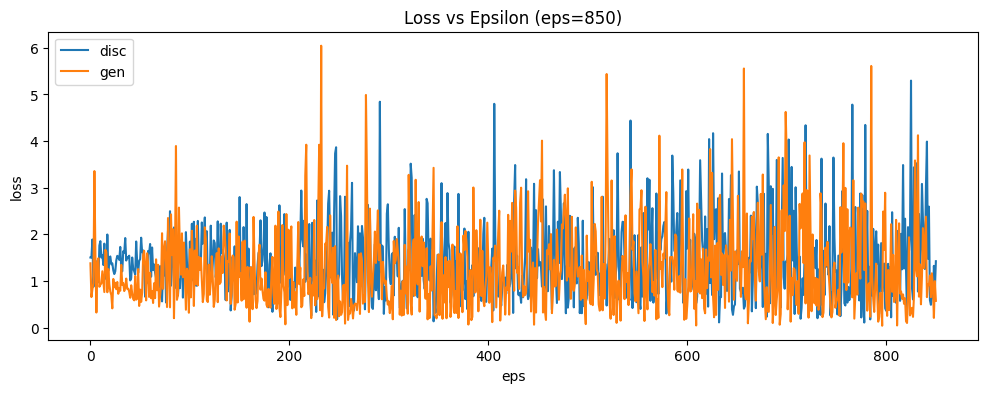

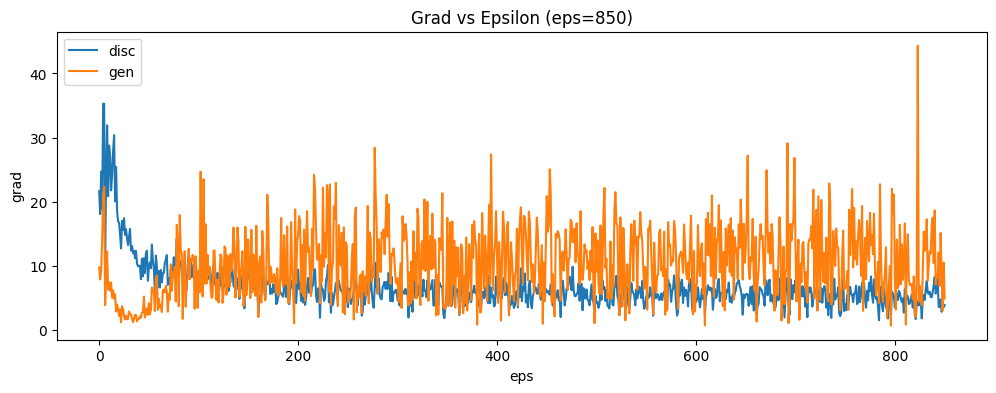

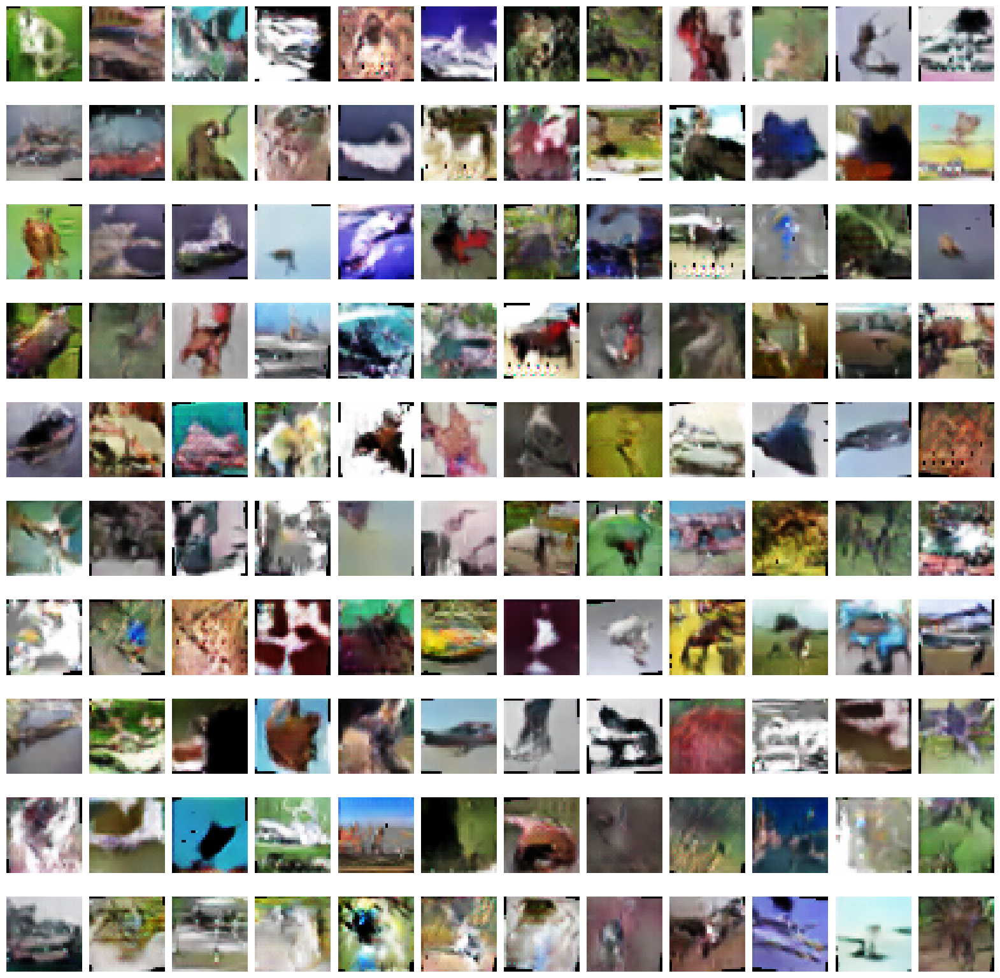

Epoch [851/1001] Loss D: 3.62563, Loss G: 1.16748
Epoch [852/1001] Loss D: 0.77522, Loss G: 0.16205
Epoch [853/1001] Loss D: 1.15024, Loss G: 1.36176
Epoch [854/1001] Loss D: 1.59975, Loss G: 1.50496
Epoch [855/1001] Loss D: 0.66753, Loss G: 1.39333
Epoch [856/1001] Loss D: 0.12973, Loss G: 1.63362
Epoch [857/1001] Loss D: 2.63171, Loss G: 2.11813
Epoch [858/1001] Loss D: 0.39668, Loss G: 1.34066
Epoch [859/1001] Loss D: 1.23863, Loss G: 2.15291
Epoch [860/1001] Loss D: 2.94482, Loss G: 1.49387
Epoch [861/1001] Loss D: 1.48180, Loss G: 0.14977
Epoch [862/1001] Loss D: 1.02537, Loss G: 0.90149
Epoch [863/1001] Loss D: 1.79131, Loss G: 0.57213
Epoch [864/1001] Loss D: 1.39721, Loss G: 3.00752
Epoch [865/1001] Loss D: 2.05938, Loss G: 1.06342
Epoch [866/1001] Loss D: 3.44515, Loss G: 0.09004
Epoch [867/1001] Loss D: 0.22079, Loss G: 1.98033
Epoch [868/1001] Loss D: 1.26531, Loss G: 0.42434
Epoch [869/1001] Loss D: 1.63346, Loss G: 0.07893
Epoch [870/1001] Loss D: 2.25436, Loss G: 1.73191


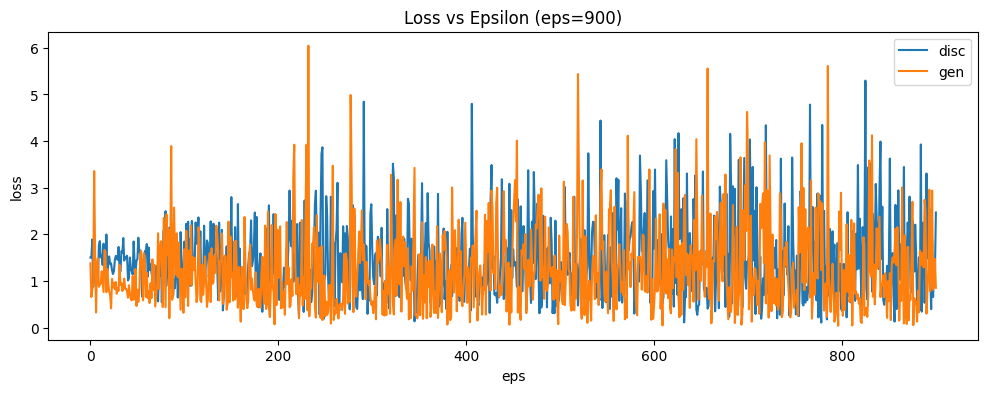

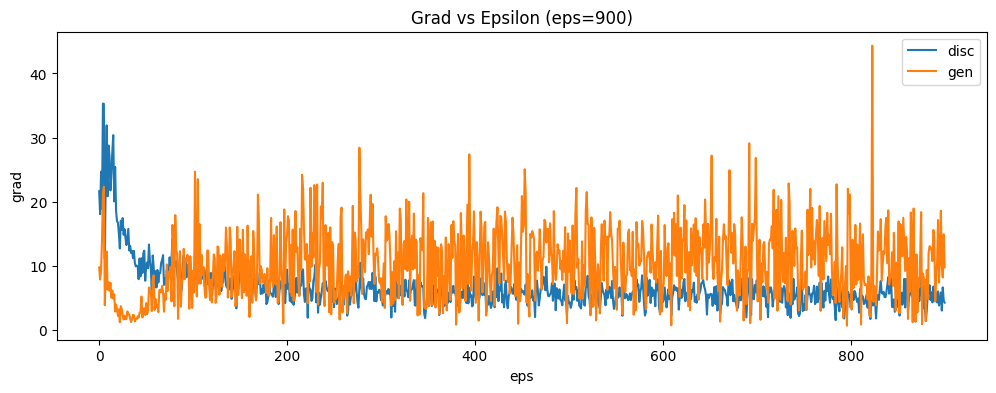

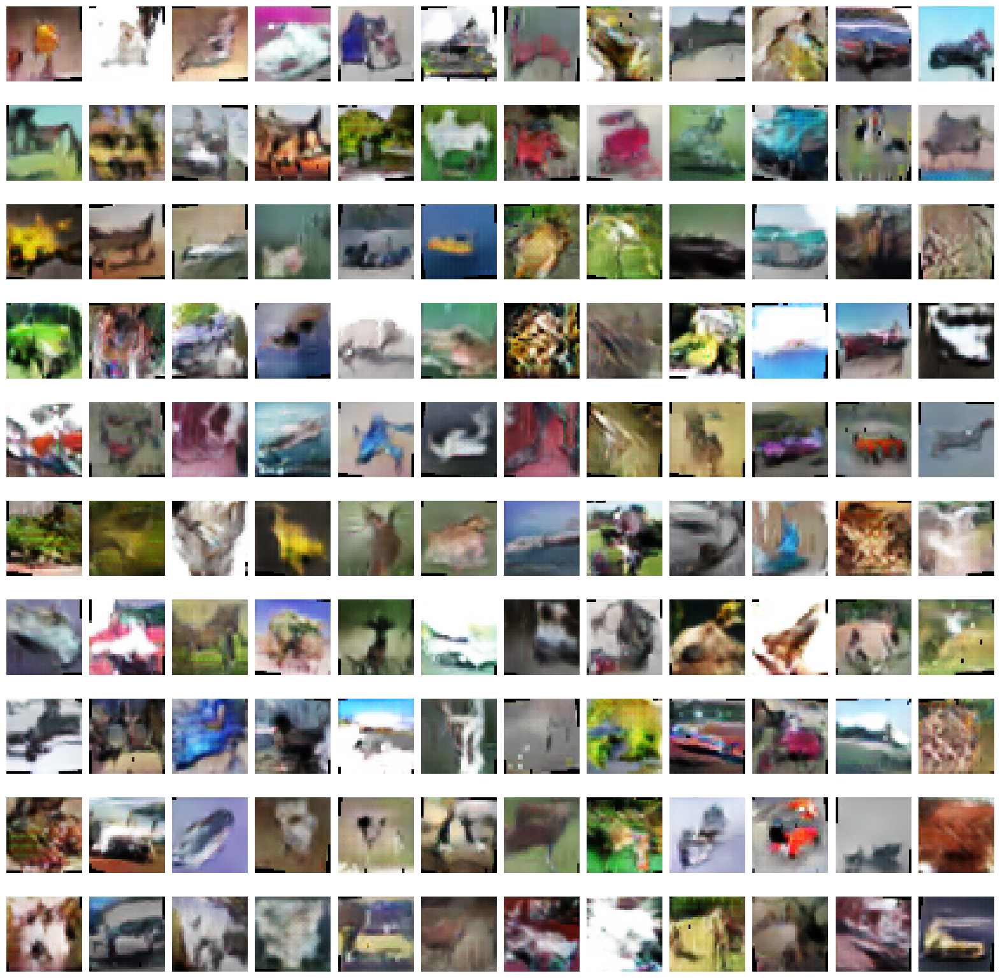

Epoch [901/1001] Loss D: 0.43944, Loss G: 0.95548
Epoch [902/1001] Loss D: 2.33067, Loss G: 1.44715
Epoch [903/1001] Loss D: 0.91472, Loss G: 0.05112
Epoch [904/1001] Loss D: 0.65707, Loss G: 0.36534
Epoch [905/1001] Loss D: 0.88075, Loss G: 2.05417
Epoch [906/1001] Loss D: 1.87092, Loss G: 1.82778
Epoch [907/1001] Loss D: 1.96373, Loss G: 0.98648
Epoch [908/1001] Loss D: 2.55233, Loss G: 0.49557
Epoch [909/1001] Loss D: 0.83508, Loss G: 2.15682
Epoch [910/1001] Loss D: 0.66009, Loss G: 0.88590
Epoch [911/1001] Loss D: 2.38875, Loss G: 0.39328
Epoch [912/1001] Loss D: 0.30349, Loss G: 0.72898
Epoch [913/1001] Loss D: 1.76994, Loss G: 0.15765
Epoch [914/1001] Loss D: 1.37645, Loss G: 1.67974
Epoch [915/1001] Loss D: 0.36739, Loss G: 0.29669
Epoch [916/1001] Loss D: 0.26938, Loss G: 0.64926
Epoch [917/1001] Loss D: 1.08525, Loss G: 4.67128
Epoch [918/1001] Loss D: 2.73267, Loss G: 1.05533
Epoch [919/1001] Loss D: 0.62098, Loss G: 1.19515
Epoch [920/1001] Loss D: 0.76704, Loss G: 0.82537


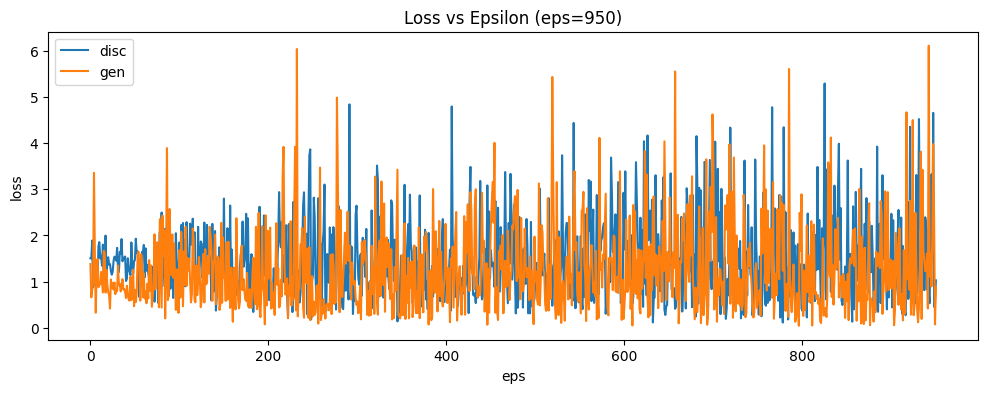

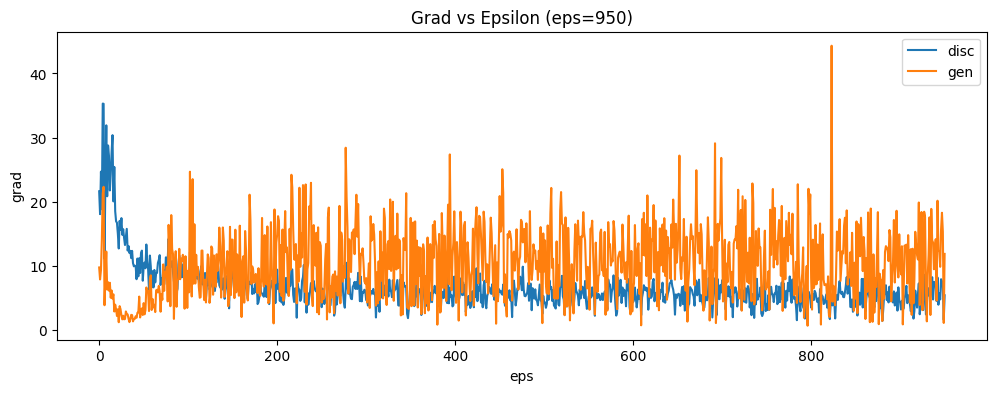

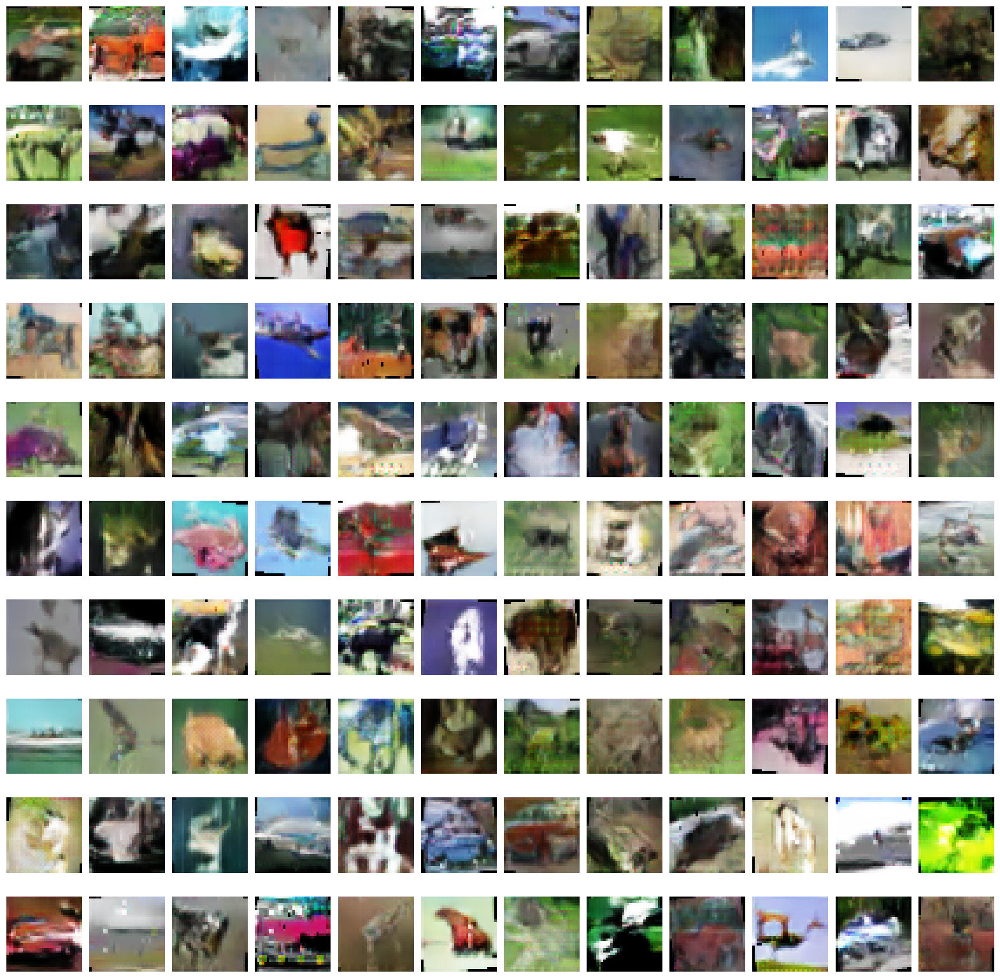

Epoch [951/1001] Loss D: 1.69522, Loss G: 2.29591
Epoch [952/1001] Loss D: 2.75625, Loss G: 1.02480
Epoch [953/1001] Loss D: 2.51909, Loss G: 0.78865
Epoch [954/1001] Loss D: 1.26285, Loss G: 0.96814
Epoch [955/1001] Loss D: 0.92963, Loss G: 2.34853
Epoch [956/1001] Loss D: 0.76317, Loss G: 0.34600
Epoch [957/1001] Loss D: 0.29777, Loss G: 4.31853
Epoch [958/1001] Loss D: 1.35941, Loss G: 2.80408
Epoch [959/1001] Loss D: 0.35156, Loss G: 3.44903
Epoch [960/1001] Loss D: 2.08163, Loss G: 0.13153
Epoch [961/1001] Loss D: 2.64766, Loss G: 0.31134
Epoch [962/1001] Loss D: 0.94700, Loss G: 1.74471
Epoch [963/1001] Loss D: 0.55162, Loss G: 2.23444
Epoch [964/1001] Loss D: 0.74982, Loss G: 0.60428
Epoch [965/1001] Loss D: 0.81795, Loss G: 1.31792
Epoch [966/1001] Loss D: 1.34717, Loss G: 1.89152
Epoch [967/1001] Loss D: 0.52627, Loss G: 3.57980
Epoch [968/1001] Loss D: 1.05635, Loss G: 1.24223
Epoch [969/1001] Loss D: 2.25053, Loss G: 1.82893
Epoch [970/1001] Loss D: 1.41312, Loss G: 0.10882


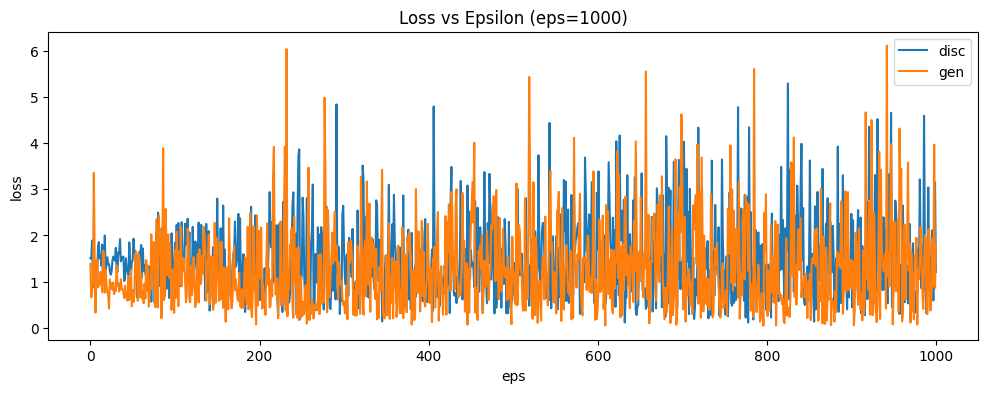

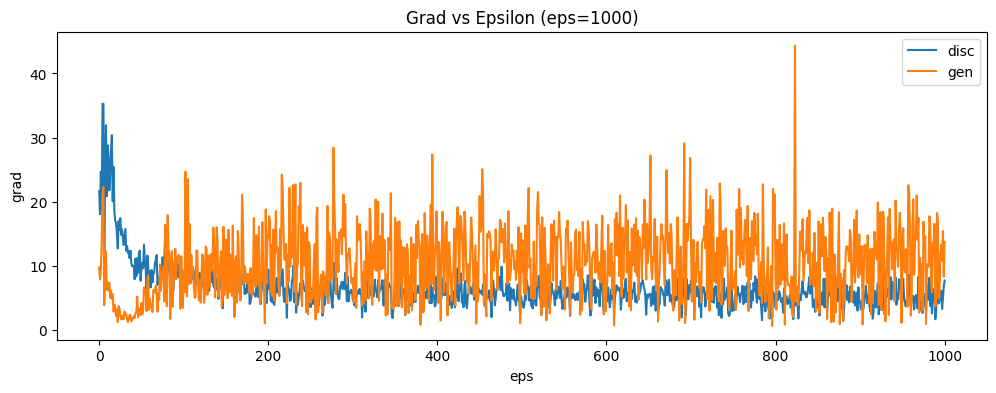

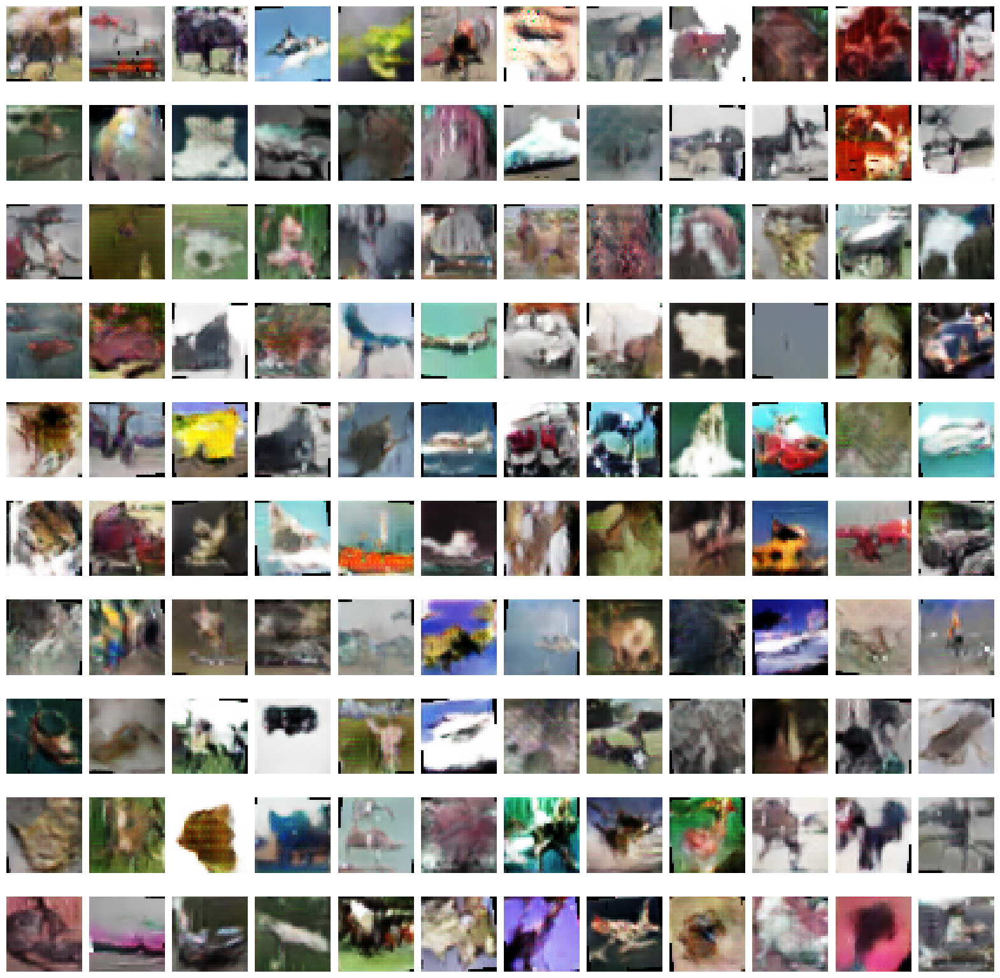

In [8]:
loss_disc_arr = []
loss_gen_arr = []
grad_disc_arr = []
grad_gen_arr = []
for i in range(epochs):

    generator.train()
    discriminator.train()
    
    for batch_idx, (real_images, _) in enumerate(train_dataloader):
        batch_size = real_images.size(0)

        REAL = torch.ones(batch_size, 1, requires_grad=False, device=device)
        FAKE = torch.zeros(batch_size, 1, requires_grad=False, device=device)

        real_images = real_images.to(device)

        # train discriminator
        discriminator.zero_grad()

        # Loss for real images
        real_validity_pred = discriminator(real_images)
        validity_loss_real = adversarial_loss(real_validity_pred, REAL)

        # Generate fake images and labels
        noise = torch.normal(0, 1, (batch_size, z_dim)).to(device)
        fake_images = generator(noise)

        # Loss for fake images
        fake_validity_pred = discriminator(fake_images.detach())
        validity_loss_fake = adversarial_loss(fake_validity_pred, FAKE)

        # Total discriminator loss
        loss_disc = validity_loss_real + validity_loss_fake
        loss_disc.backward()
        opt_disc.step()

        # train generator
        generator.zero_grad()

        # All fake images are treated as real
        validity_pred = discriminator(fake_images)
        loss_gen = adversarial_loss(validity_pred, REAL)
        loss_gen.backward()
        opt_gen.step()

    print(f"Epoch [{i}/{epochs}] Loss D: {loss_disc:.5f}, Loss G: {loss_gen:.5f}")
    loss_disc_arr.append(loss_disc.detach().cpu().numpy().item())
    loss_gen_arr.append(loss_gen.detach().cpu().numpy().item())
    # only the grad of the last layer
    grad_disc_arr.append(discriminator.net[-2].weight.grad.norm().item())
    grad_gen_arr.append(generator.net[-2].weight.grad.norm().item())

    # Save Model
    if i % 50 == 0 and i != 0:
        print("Saving ...")
        torch.save(generator.state_dict(), 'generator_Ori_GAN_'+str(i)+'.pth')
        torch.save(discriminator.state_dict(), 'discriminator_Ori_GAN_'+str(i)+'.pth')
        
        # testing
        generator_test = Generator(z_dim).to(device)
        generator_test.load_state_dict(torch.load('generator_Ori_GAN_'+str(i)+'.pth'))
        generator_test.eval()

        noise = torch.normal(0, 1, (120, z_dim)).to(device)
        images = generator_test(noise)
        images = images.permute(0, 2, 3, 1)
        images = (images + 1.0) / 2.0

        plot_losses(loss_disc_arr, loss_gen_arr, i)
        plot_grads(grad_disc_arr, grad_gen_arr, i)

        i = 0
        plt.figure(figsize=(20, 20))
        for image in images:
            plt.subplot(10,12,i+1);plt.imshow(image.detach().cpu().numpy());plt.axis("off");
            i = i + 1
        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        # plt.tight_layout()
        plt.show()